In this notebook, different graph convolutional layer types are tested for their predictive capabilities. Given MSOA street graphs, they are asked to predict the number of amenities accessible for residents within 15 minutes walk. The models are saved, and the best performing model is frozen. Graphs are passed through this model to create embeddings, which are then saved as a CSV.

# Import Libraries

In [1]:
import os
import torch
os.environ['TORCH'] = torch.__version__

In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import networkx as nx
import contextily as cx

In [48]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data, Dataset, DataLoader
from torch_geometric.loader import DataLoader
from torch.optim import Adam
from torch_geometric.nn import GCNConv, GINConv, SAGEConv, GATv2Conv, MLP
from torch.nn import Linear, Sequential, ReLU, Module, ModuleList, BatchNorm1d as BN, functional as F
from torch_geometric.nn import global_mean_pool

In [41]:
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import r2_score

In [5]:
if torch.cuda.is_available():
    device = torch.device('cuda')
elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')

# Define Functions

## Call dataset

In [129]:
class EW_msoa_graphs(Dataset):
    def __init__(self, root):
        super().__init__()
        self.root = root
        
    @property
    # make list of cities in the processed .pt file
    def processed_file_names(self):
        return [f'{msoa}' for msoa in os.listdir(self.root) if msoa.endswith('.pt')]

    def len(self):
        return len(self.processed_file_names)

    # call all graphs by iterating through index, finding names, and calling with names
    def get(self, idx):
        file_name = self.processed_file_names[idx]  # automatically raise IndexError if idx is out of range
        return self.load_graph(os.path.join(self.root, file_name))

    def load_graph(self, file_path):
        try:
            return torch.load(file_path)
        except FileNotFoundError:
            raise FileNotFoundError(f"File {file_path} not found.")

    def get_by_filename(self, filename):
        # Method to load a single graph directly by filename
        if filename in self.processed_file_names:
            return self.load_graph(os.path.join(self.root, filename))
        else:
            raise FileNotFoundError(f"File {filename} not found in dataset directory.")

## Train

In [7]:
def train(model, optimizer, criterion, device, epochs, train_loader):
    model.train()  # Set the model to training mode
    epoch_losses = []  # Initialize a list to store the average loss of each epoch

    for epoch in range(epochs):  # Loop over the number of epochs
        total_loss = 0
        total_graphs = 0
        for data in train_loader:  # Loop over batches of data
            data = data.to(device)  # Move data to the same device as the model
            optimizer.zero_grad()  # Clear gradients
            out = model(data.x, data.edge_index, data.batch)  # Perform a forward pass
            out = out.squeeze(-1)
            loss = criterion(out, data.y)  # Calculate loss
            loss.backward()  # Perform backpropagation
            optimizer.step()  # Update model parameters
            
            total_loss += loss.item() * data.num_graphs  # Multiply loss by the number of graphs in the batch
            total_graphs += data.num_graphs

        # Calculate the average loss for this epoch and store it
        average_loss = total_loss / total_graphs
        epoch_losses.append(average_loss)  # Append the average loss to the list

    return epoch_losses, average_loss  # Return the list of average losses + the last average loss

## Test

In [8]:
def test(model, criterion, device, test_loader):
    model.eval()  # Set model to evaluation mode
    total_loss = 0
    total_graphs = 0
    
    for data in test_loader:  # Loop over batches of data
        data = data.to(device)  # Move data to the same device as the model
        out = model(data.x, data.edge_index, data.batch)  # Perform a forward pass
        out = out.squeeze(-1)  # Make sure output has correct shape for regression
        
        # Calculate loss; here, data.y is the labels
        loss = criterion(out, data.y)
        total_loss += loss.item() * data.num_graphs  # Multiply loss by the number of graphs in the batch
        total_graphs += data.num_graphs

    average_loss = total_loss / total_graphs
    return average_loss

## Save trained model

In [9]:
def save_model(model, model_name, num_layers, data):
    # Construct the directory path
    directory_path = os.path.join('trained_models', data, f'{model_name}', f'{num_layers}_layers')

    # Create the directory if it does not exist
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
    
    # Define the full path for saving the model
    model_path = os.path.join(directory_path, f"{model_name}_{num_layers}layer.pth")

    # Save the model
    torch.save(model.state_dict(), model_path)

## Plot Training Progress

In [10]:
def plot_model_training(model_name, epoch_losses, num_layers, data):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    ax.plot(epoch_losses, marker='o', linestyle='-', color='red')  # Plot the losses on the provided axes
    ax.set_title(f"Training loss for {data}, {num_layers} layers", fontsize=16)  # Set the title to model_name
    ax.set_xlabel('Epoch')  # Label the x-axis
    ax.set_ylabel('Loss')  # Label the y-axis
    ax.grid(True)  # Add a grid
    
    directory_path = os.path.join('trained_models', data, f'{model_name}', f'{num_layers}_layers')
    # Ensure the directory exists
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
    
    # Define the full path for saving the plot
    plot_path = os.path.join(directory_path, f"{data}_{num_layers}layers_{model_name}_TrainingLosses.png")
    plt.savefig(plot_path)
    
    plt.show()  # Display the plot

## Load Trained Model

In [11]:
def load_model(model_class, model_path, num_features, num_layers, hidden_channels):
    # Initialize the model first
    model = model_class(num_features, num_layers, hidden_channels)
    model_state = torch.load(model_path)
    model.load_state_dict(model_state)
    model.eval() # make sure the model does not continue adjusting weights after being trained and saved
    return model

In [12]:
def get_model_predictions(model, y_file, data_folder):
    model.eval()

    # create gdf of MSOA boundaries, true value and prediction
    geo_y_truth = msoa.merge(y_file, on='MSOA11CD', how='left')    
    geo_y_predicted = geo_y_truth
    
    def load_graph(filename):
        return torch.load(filename)
    
    # Loop through each MSOA and make predictions
    for index, row in geo_y_predicted.iterrows():
        file_path = os.path.join(data_folder, row['MSOA11CD'] + '.pt')
        if os.path.exists(file_path):  # Check if the graph file exists
            graph = load_graph(file_path)
            # Predict single graph per batch, no batch dimension needed
            batch = torch.zeros(graph.num_nodes, dtype=torch.long)
            # directly use the model's output as prediction
            prediction = model(graph.x, graph.edge_index, batch).squeeze().item()
            # add prediction to dataframe
            geo_y_predicted.at[index, 'Predicted_Value'] = prediction
            
        else:
            geo_y_truth.at[index, 'Predicted_Value'] = None

    # return predictions
    return geo_y_predicted

## Visualize Predictions

In [13]:
# Import geography file, clean
msoa = gpd.read_file("geographies/MSOA_2011_EW_BFC_shp/MSOA_2011_EW_BFC.shp")
nonrural_MSOAs = pd.read_csv('geographies/nonrural_MSOAs.csv')
# Drop rural MSOAs
msoa = msoa.merge(nonrural_MSOAs, on='MSOA11CD', how='inner')
# Drop Welsh MSOAs
msoa = msoa[~msoa['MSOA11CD'].str.startswith('W02')]

In [14]:
def plot_model_prediction(prediction, num_layers, data, model_class, model_name, plot_title, y_truth_column, legend_title):
    # Initialize figure and subplot mosaic
    fig, axs = plt.subplot_mosaic([
        ["A", "B", "colorbar"],
        ["C", "D", "colorbar"]
    ], figsize=(11, 10), constrained_layout=True, gridspec_kw={'width_ratios': [1, 1, 0.05], 'height_ratios': [1, 1]})

    city_centers = [(53.491013, -2.314446), (54.983156, -1.608169), 
                    (52.497836, -1.965555), (51.506392, -0.112552)]
    city_names = ["Manchester", "Newcastle", "Birmingham", "London"]

    # Set the normalization based on the min/max of true and predicted values
    # So that plotted colors are on the same scale as the true values
    min_val = min(prediction[y_truth_column].min(), prediction['Predicted_Value'].min())
    max_val = max(prediction[y_truth_column].max(), prediction['Predicted_Value'].max())

    # Create a GeoDataFrame with city centers
    city_centers_gdf = gpd.GeoDataFrame(geometry=gpd.points_from_xy([lng for lat, lng in city_centers],
                                                                    [lat for lat, lng in city_centers]),
                                        crs="EPSG:4326").to_crs(epsg=27700)
    buffer = 25000  # Buffer in meters

    # Plot each city with the consistent color scale
    for pos, (index, row) in zip(['A', 'B', 'C', 'D'], city_centers_gdf.iterrows()):
        ax = axs[pos]
        ax.set_xlim(row.geometry.x - buffer, row.geometry.x + buffer)
        ax.set_ylim(row.geometry.y - buffer, row.geometry.y + buffer)
        prediction.plot(column='Predicted_Value', ax=ax, alpha=0.8, legend=False, cmap='RdYlGn', edgecolor='none',
                        norm=plt.Normalize(vmin=min_val, vmax=max_val))
        cx.add_basemap(ax, crs=prediction.crs.to_string(), source=cx.providers.CartoDB.Positron)
        ax.set_title(city_names[index], position=(0.5, -0.1))
        ax.set_xticks([])
        ax.set_yticks([])

    # Configure the colorbar
    cax = axs['colorbar']
    sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=min_val, vmax=max_val))
    sm._A = []
    fig.colorbar(sm, cax=cax, orientation='vertical').set_label(legend_title)
    fig.suptitle(plot_title, fontsize=16)

    # Save plot and data
    save_predictions(prediction, model_name, data, num_layers)

    # Display plot
    plt.show()

In [15]:
# save csv of model predictions and plot of model predictions to model folder
def save_predictions(prediction, model_name, data, num_layers):
    directory = os.path.join('trained_models', data, model_name, f'{num_layers}_layers')
    if not os.path.exists(directory):
        os.makedirs(directory)

    plot_path = os.path.join(directory, f"{model_name}_{num_layers}layer_Predictions.png")
    prediction.to_csv(os.path.join(directory, f"{model_name}_{num_layers}layer_Predictions.csv"), index=False)

    plt.savefig(plot_path)
    print(f"Saved plot to {plot_path}")
    print(f"Saved CSV to {os.path.join(directory, f'{model_name}_{num_layers}layer_Predictions.csv')}")

In [78]:
# plot distribution of data to check its not all predicting the same thing
def plot_predicted_data_distribution(prediction, model_name, num_layers, data, y_truth_column):
    fig, ax = plt.subplots(figsize=(10, 6))
    bins = np.linspace(min(prediction[y_truth_column].min(), prediction['Predicted_Value'].min()), 
                       max(prediction[y_truth_column].max(), prediction['Predicted_Value'].max()), 30)
    ax.hist(prediction[y_truth_column], bins=bins, alpha=0.5, label='True Values', color='grey')
    ax.hist(prediction['Predicted_Value'], bins=bins, alpha=0.5, label='Predicted Values', color='blue')
    ax.set_title(f'{model_name}, {num_layers} Layers Model Predictions vs. True Values, {data} data')
    ax.set_xlabel('Value')
    ax.set_ylabel('Density')
    ax.legend()
    plt.show()

    # Get R^2 score while we're here
    prediction.dropna(subset=[y_truth_column, 'Predicted_Value'], inplace=True)
    y_true = prediction[y_truth_column]
    y_pred = prediction['Predicted_Value']
    r2 = r2_score(y_true, y_pred)
    print("R^2 Score:", r2)

## Call routine

In [32]:
def call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column):
    # retrieve y values for prediction
    y_file_path = f'clean_y_values/y_{data}.csv'
    y_file = pd.read_csv(y_file_path)

    # retrieve graph data for training
    data_folder = f'graphs/graphs_{data}'
    dataset = EW_msoa_graphs(root=data_folder)
    legend_title = plot_title

    dataset_size = dataset.len()  # Get the total number of graphs in the dataset
    train_size = int(0.8 * dataset_size)  # Calculate 80% of the dataset size

    np.random.seed(42)  # Set a seed for NumPy random operations
    torch.manual_seed(42)  # Set a seed for PyTorch random operations

    # Shuffle the dataset using a consistent random seed
    shuffled_dataset = dataset.shuffle()

    # create and shuffle test and train datasets
    train_dataset = shuffled_dataset[:train_size]
    test_dataset = shuffled_dataset[train_size:]
    
    # DataLoader with specific seed for reproducibility in the sampling process
    train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

    # initiate list to hold model loss during training
    model_losses_list = []

    # set number of node features
    num_node_features = dataset.num_node_features
    #print(num_node_features)

    # set loss hyperparameter
    criterion=torch.nn.MSELoss()

    # initiate model with number of features, layers, and hidden channels, other hyperparameters
    model=model_class(num_node_features, num_layers, hidden_channels)    
    optimizer = Adam(model.parameters(), lr=0.01)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    epochs = epochs

    # print which model is training
    class_string = f'{model_class}'
    model_name = class_string.split('.')[-1].rstrip("'>")
    print(f'Training {model_name} Model')

    # Train model and record training loss
    epoch_losses, average_loss = train(model, optimizer, criterion, device, epochs, train_loader)
    # test model on test dataset
    test_loss = test(model, criterion, device, test_loader)
    # print train and test loss
    print(f"{model_name} {num_layers} layers final training loss: {average_loss}")
    print(f"{model_name} {num_layers} layers test loss: {test_loss}")

    # save model in current state
    save_model(model, model_name, num_layers, data)

    # plot model training loss over epochs
    plot_model_training(model_name, epoch_losses, num_layers, data)
    # get model to make predictions across entire dataset
    prediction = get_model_predictions(model, y_file, data_folder)
    # plot these predictions
    plot_model_prediction(prediction, num_layers, data, model_class, model_name, plot_title, y_truth_column, legend_title)
    # plot data distribution of predictions
    plot_predicted_data_distribution(prediction, model_name, num_layers, data, y_truth_column)

# Define Models

## GNN

In [69]:
class GNN(torch.nn.Module):
    def __init__(self, num_features, num_layers, hidden_channels):
        super().__init__()

        # Initial linear transformation layer
        self.initial_transform = torch.nn.Linear(num_features, hidden_channels)

        # create convolutional layers
        self.convs = torch.nn.ModuleList()
        for _ in range(num_layers):
            self.convs.append(GCNConv(hidden_channels, hidden_channels))

        # final linear layers
        self.lin1 = torch.nn.Linear(hidden_channels, hidden_channels)
        self.lin2 = torch.nn.Linear(hidden_channels, 1)
        self.return_embeddings = False  # Initialize flag

    
    def forward(self, x, edge_index, batch):
        x = self.initial_transform(x)
        for conv in self.convs:
            x = F.relu(conv(x, edge_index))
        embeddings = global_mean_pool(x, batch)
        x = F.relu(self.lin1(embeddings))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.lin2(x)

        if self.return_embeddings:
            return embeddings
        
        return x

    def enable_embedding_output(self):
        self.return_embeddings = True

    def disable_embedding_output(self):
        self.return_embeddings = False

## GIN

In [58]:
class GIN(torch.nn.Module):
    def __init__(self, num_features, num_layers, hidden_channels):
        super().__init__()
        
        # Initial linear transformation layer
        self.initial_layer = torch.nn.Linear(num_features, hidden_channels)

        # convolutional / MLP layers
        self.convs = torch.nn.ModuleList()
        for _ in range(num_layers):
            mlp = MLP([hidden_channels, hidden_channels, hidden_channels])
            self.convs.append(GINConv(nn=mlp, train_eps=False))
            in_channels = hidden_channels
            out_channels = hidden_channels

        # final linear layers
        self.lin1 = Linear(hidden_channels, hidden_channels)
        self.lin2 = Linear(hidden_channels, 1)
        self.return_embeddings = False  # Initialize flag

    
    def forward(self, x, edge_index, batch):
        x = self.initial_layer(x)
        for conv in self.convs:
            x = conv(x, edge_index)
        embeddings = global_mean_pool(x, batch)
	# Classification Head
        x = F.relu(self.lin1(embeddings))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.lin2(x)

        if self.return_embeddings:
            return embeddings
        
        return x

    def enable_embedding_output(self):
        self.return_embeddings = True

    def disable_embedding_output(self):
        self.return_embeddings = False

## GraphSAGE

In [74]:
class GraphSAGE(torch.nn.Module):
    def __init__(self, num_features, num_layers, hidden_channels):
        super().__init__()

        # Initial linear transformation layer
        self.initial_transform = torch.nn.Linear(num_features, hidden_channels)

        # convolutional layers
        self.convs = torch.nn.ModuleList()
        for _ in range(num_layers):
            self.convs.append(SAGEConv(hidden_channels, hidden_channels))

        # final linear layers to create prediction
        self.lin1 = torch.nn.Linear(hidden_channels, hidden_channels)
        self.lin2 = torch.nn.Linear(hidden_channels, 1)
        
        self.return_embeddings = False  # Initialize flag
    
    def forward(self, x, edge_index, batch):
        x = self.initial_transform(x)
        for conv in self.convs:
            x = F.relu(conv(x, edge_index))
        embeddings = global_mean_pool(x, batch)
        x = F.relu(self.lin1(embeddings))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.lin2(x)

        if self.return_embeddings:
            return embeddings
        
        return x

    def enable_embedding_output(self):
        self.return_embeddings = True

    def disable_embedding_output(self):
        self.return_embeddings = False

## GATv2

In [75]:
class GATv2(torch.nn.Module):
    def __init__(self, num_features, num_layers, hidden_channels):
        super().__init__()

        # Initial linear transformation layer
        self.initial_transform = torch.nn.Linear(num_features, hidden_channels)

        # convolutional layers
        self.convs = torch.nn.ModuleList()
        for _ in range(num_layers):
            self.convs.append(GATv2Conv(hidden_channels, hidden_channels))

        # final linear layers to create prediction
        self.lin1 = torch.nn.Linear(hidden_channels, hidden_channels)
        self.lin2 = torch.nn.Linear(hidden_channels, 1)
        self.return_embeddings = False  # Initialize flag

    def forward(self, x, edge_index, batch):
        x = self.initial_transform(x)
        for conv in self.convs:
            x = F.relu(conv(x, edge_index))
        embeddings = global_mean_pool(x, batch)
        x = F.relu(self.lin1(embeddings))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.lin2(x)

        if self.return_embeddings:
            return embeddings
        
        return x

    def enable_embedding_output(self):
        self.return_embeddings = True

    def disable_embedding_output(self):
        self.return_embeddings = False

## List models for calling

In [22]:
model_classes = {
    'GNN': GNN,
    'GIN': GIN,
    'GraphSAGE': GraphSAGE,
    'GATv2': GATv2
}

# Results

### Test all models with 3 layers 
GIN has best performance

In [91]:
data = 'n_amenities_15min'
y_truth_column = 'n_amenities_15min'
plot_title = 'Predicted Number of Amenities within 15 minutes of Residents'
hidden_channels = 32
num_layers = 1
epochs = 50

#### GNN

In [92]:
model_class=GNN

1
Training GNN Model
GNN 1 layers final training loss: 14.392306647812077
GNN 1 layers test loss: 12.710829678703757


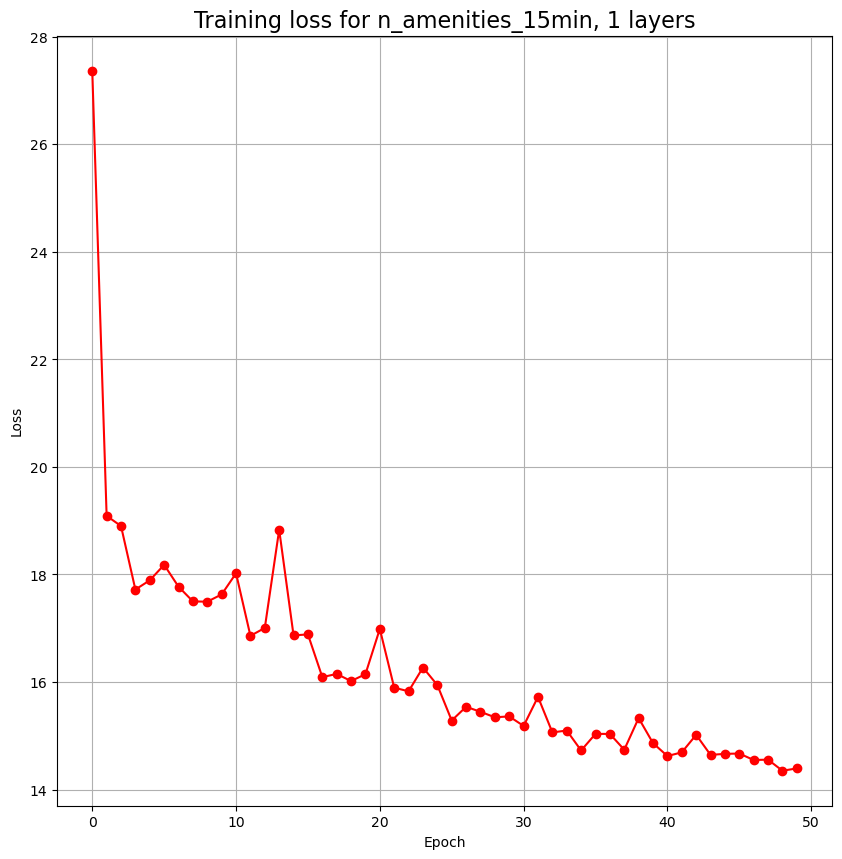

Saved plot to trained_models/n_amenities_15min/GNN/1_layers/GNN_1layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GNN/1_layers/GNN_1layer_Predictions.csv


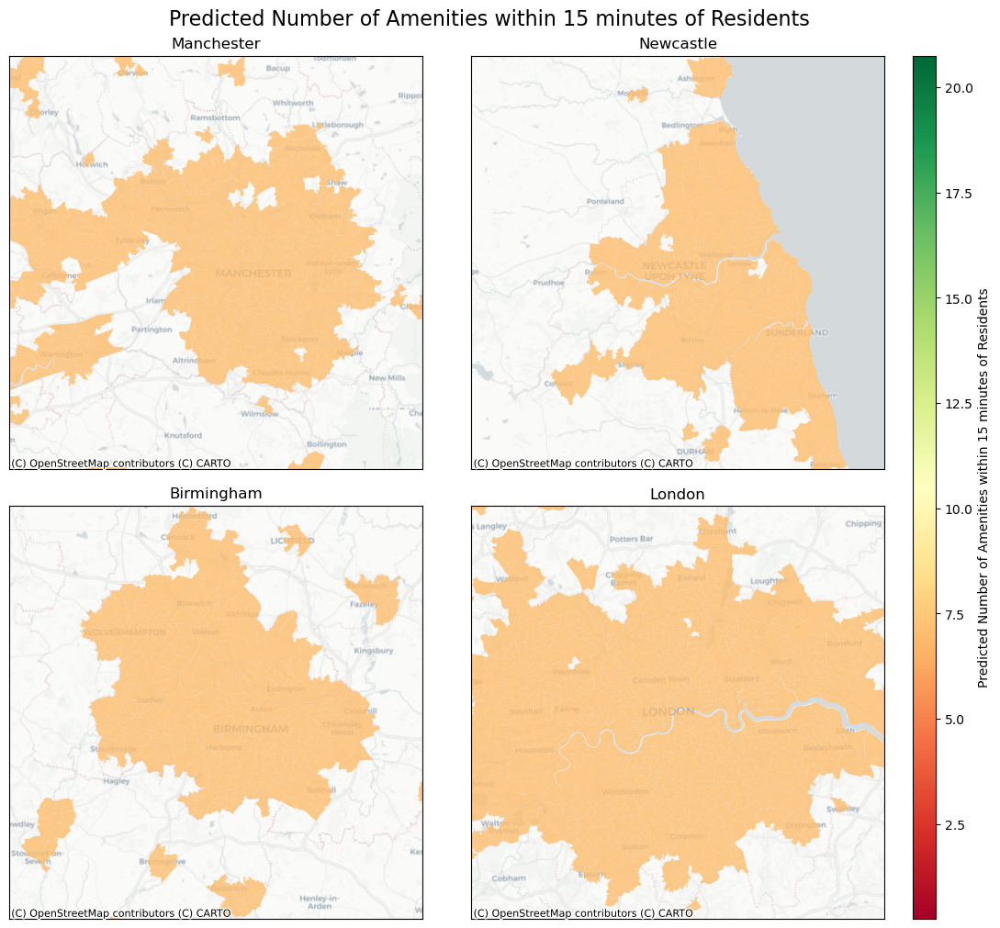

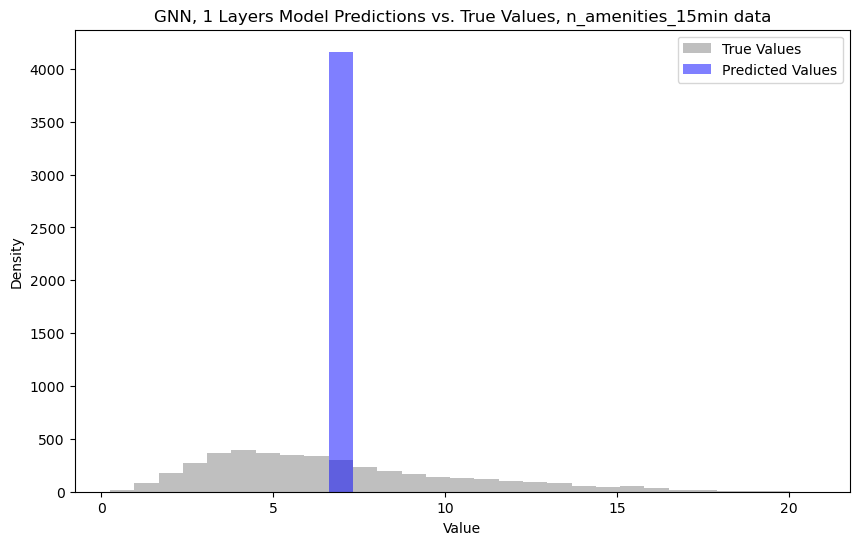

R^2 Score: 0.0005135760418332191


In [93]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

#### GIN

In [94]:
model_class=GIN

1
Training GIN Model
GIN 1 layers final training loss: 10.151631713235798
GIN 1 layers test loss: 10.946503341555738


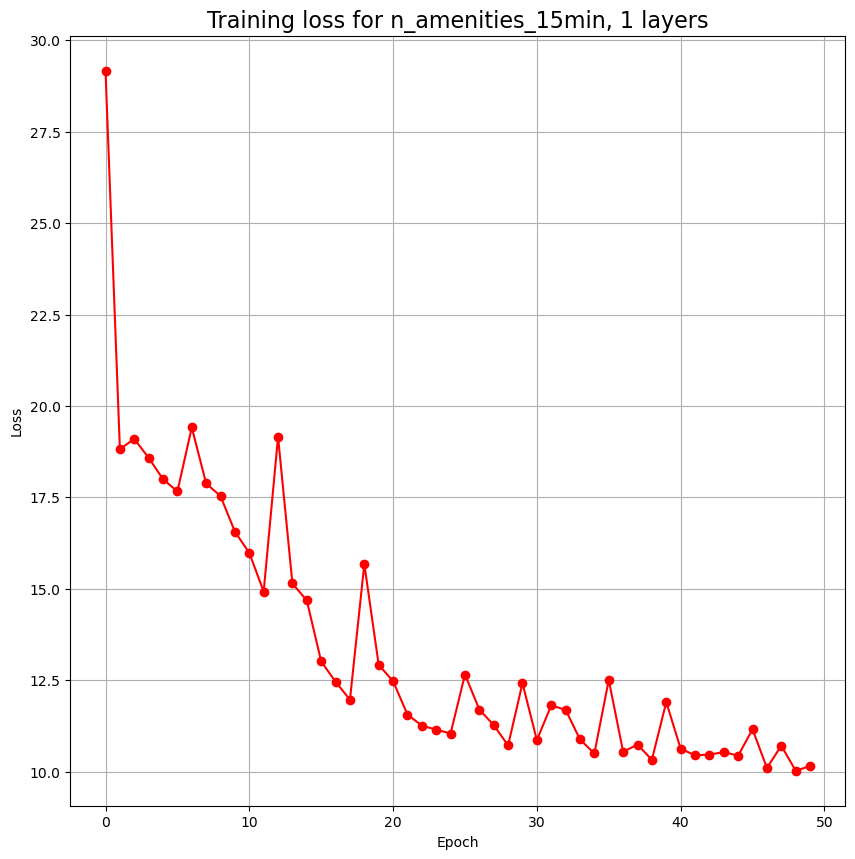

Saved plot to trained_models/n_amenities_15min/GIN/1_layers/GIN_1layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GIN/1_layers/GIN_1layer_Predictions.csv


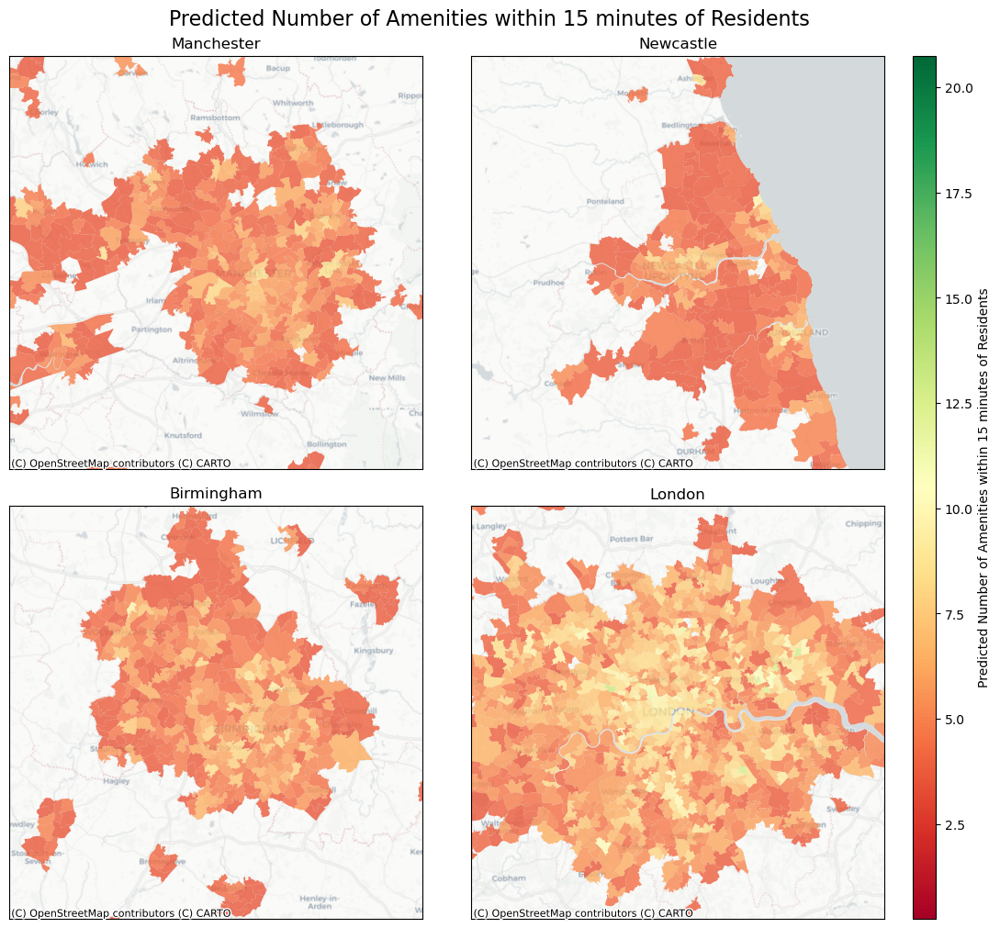

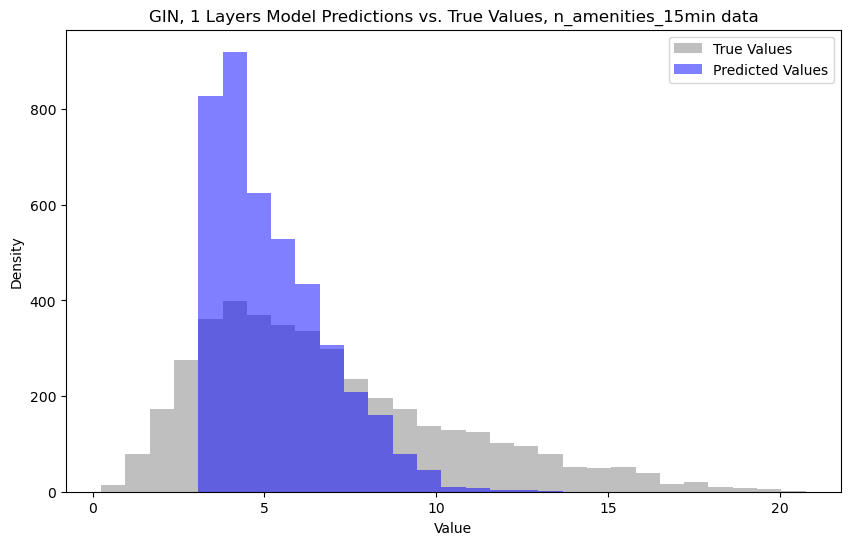

R^2 Score: 0.13420549611535904


In [95]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

#### GraphSAGE

In [96]:
model_class=GraphSAGE

1
Training GraphSAGE Model
GraphSAGE 1 layers final training loss: 14.705615612722152
GraphSAGE 1 layers test loss: 12.700148722132285


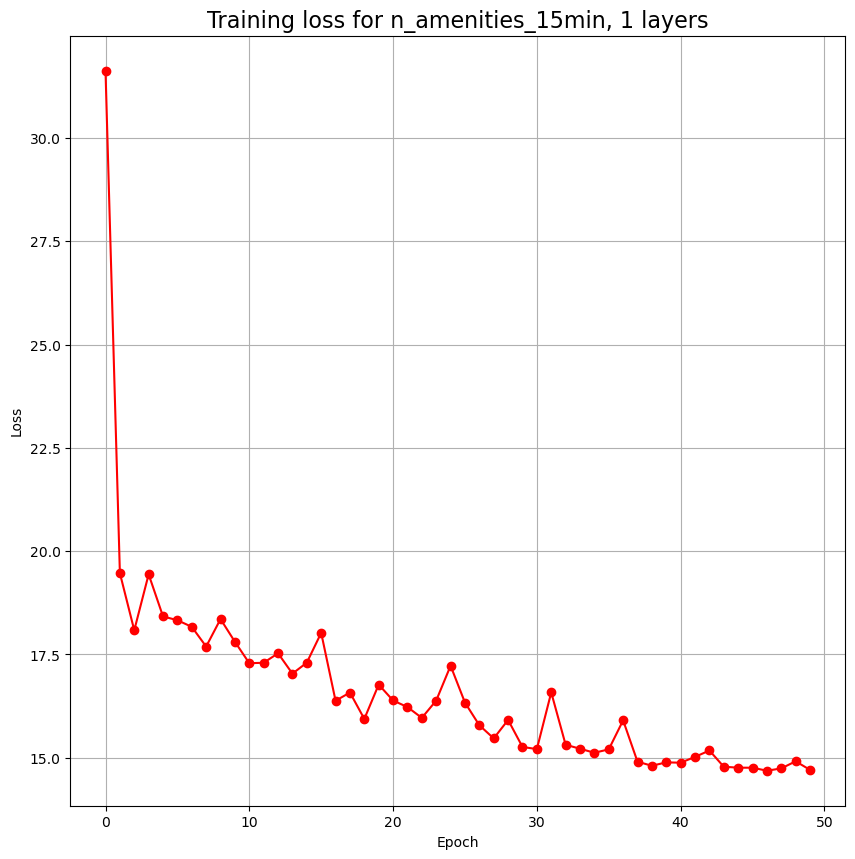

Saved plot to trained_models/n_amenities_15min/GraphSAGE/1_layers/GraphSAGE_1layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GraphSAGE/1_layers/GraphSAGE_1layer_Predictions.csv


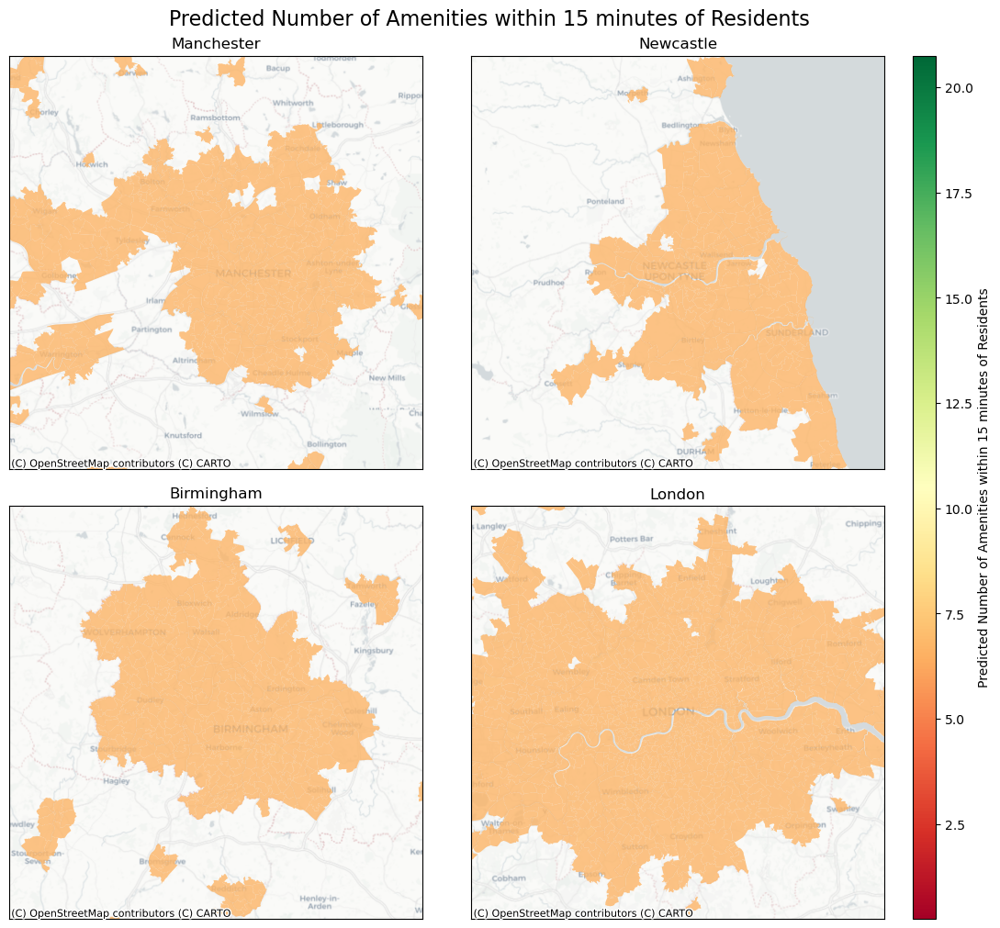

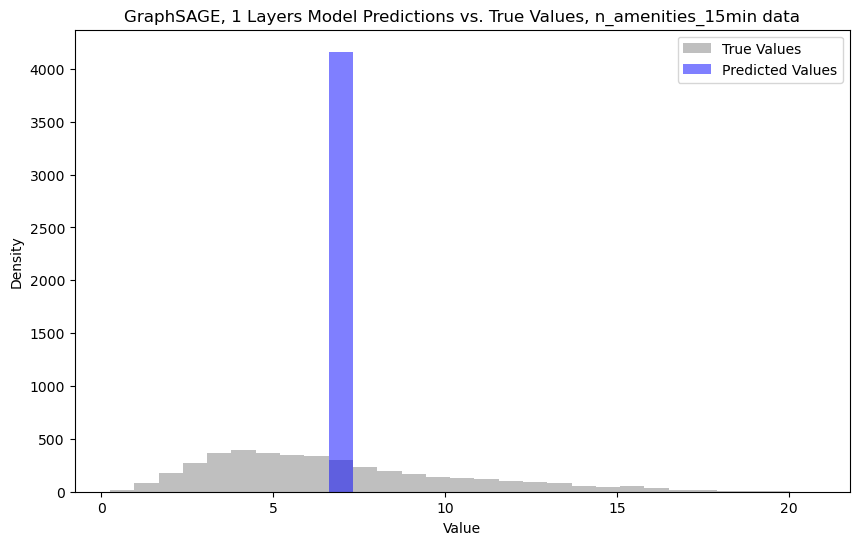

R^2 Score: 0.0005024353764808698


In [97]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

#### GATv2

In [98]:
model_class=GATv2

1
Training GATv2 Model
GATv2 1 layers final training loss: 14.655769235542065
GATv2 1 layers test loss: 12.710448312015236


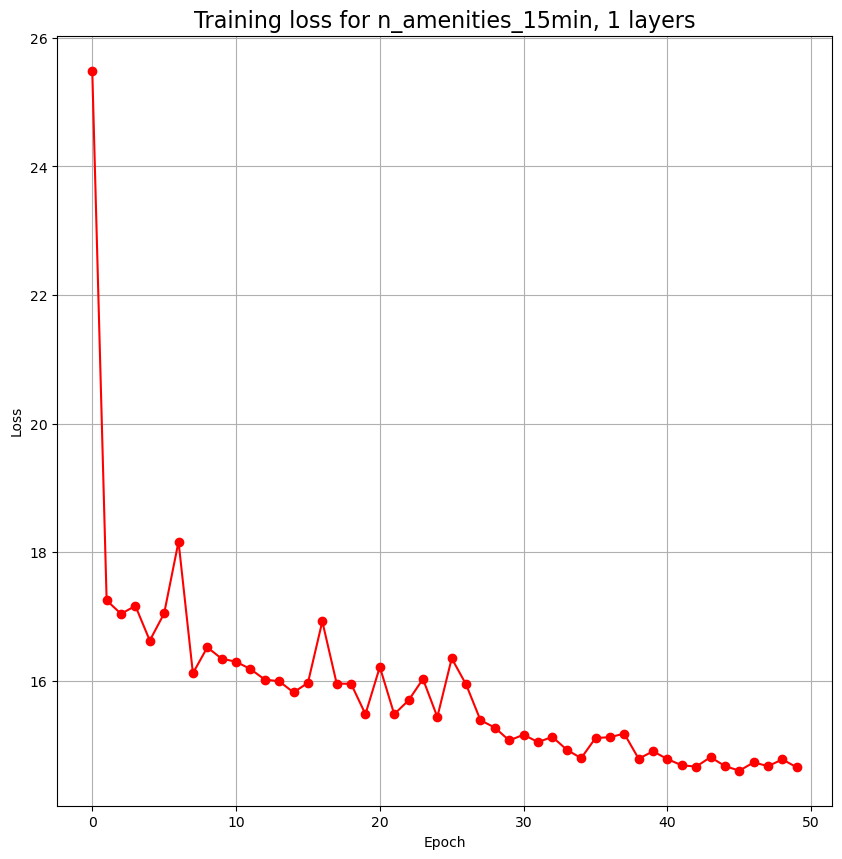

Saved plot to trained_models/n_amenities_15min/GATv2/1_layers/GATv2_1layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GATv2/1_layers/GATv2_1layer_Predictions.csv


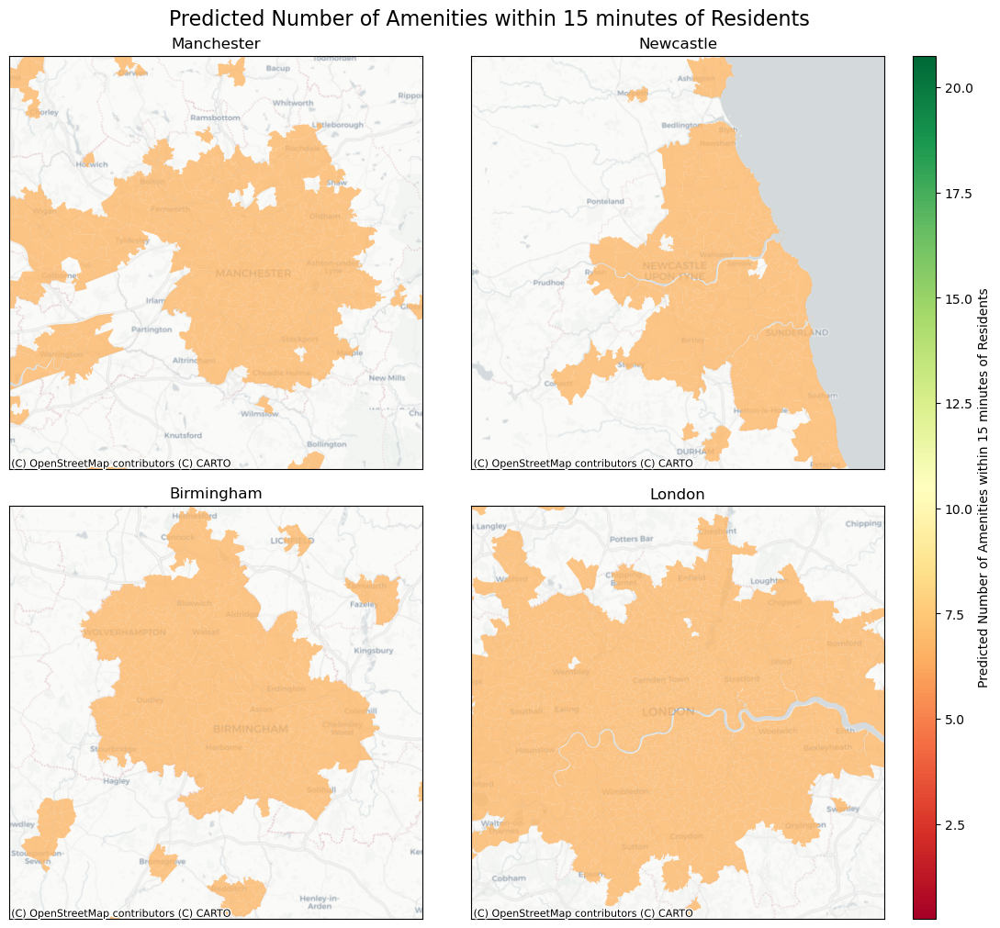

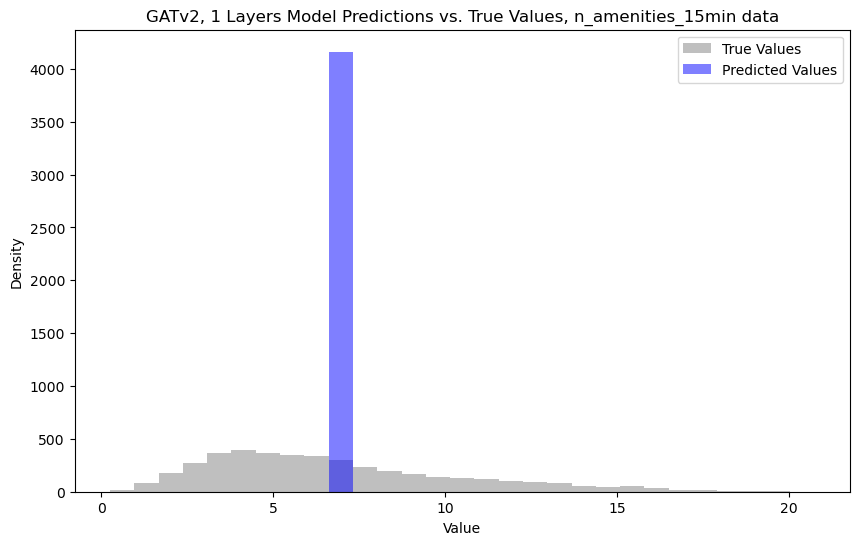

R^2 Score: -0.0003835816589068397


In [99]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

### Test GIN with 1, 5, and 10 layers to compare to 3 layer model
3 layers has best performance

In [100]:
model_class=GIN

#### 3 layer GIN

In [105]:
num_layers=3

1
Training GIN Model
GIN 3 layers final training loss: 9.628124044692777
GIN 3 layers test loss: 7.757229934935094


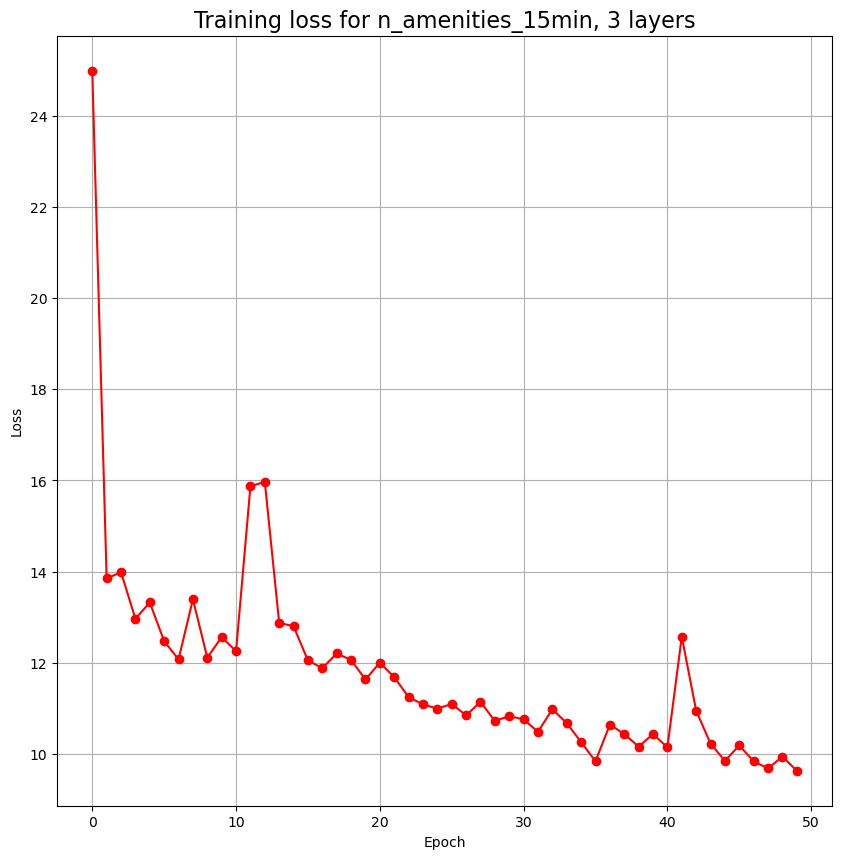

Saved plot to trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer_Predictions.csv


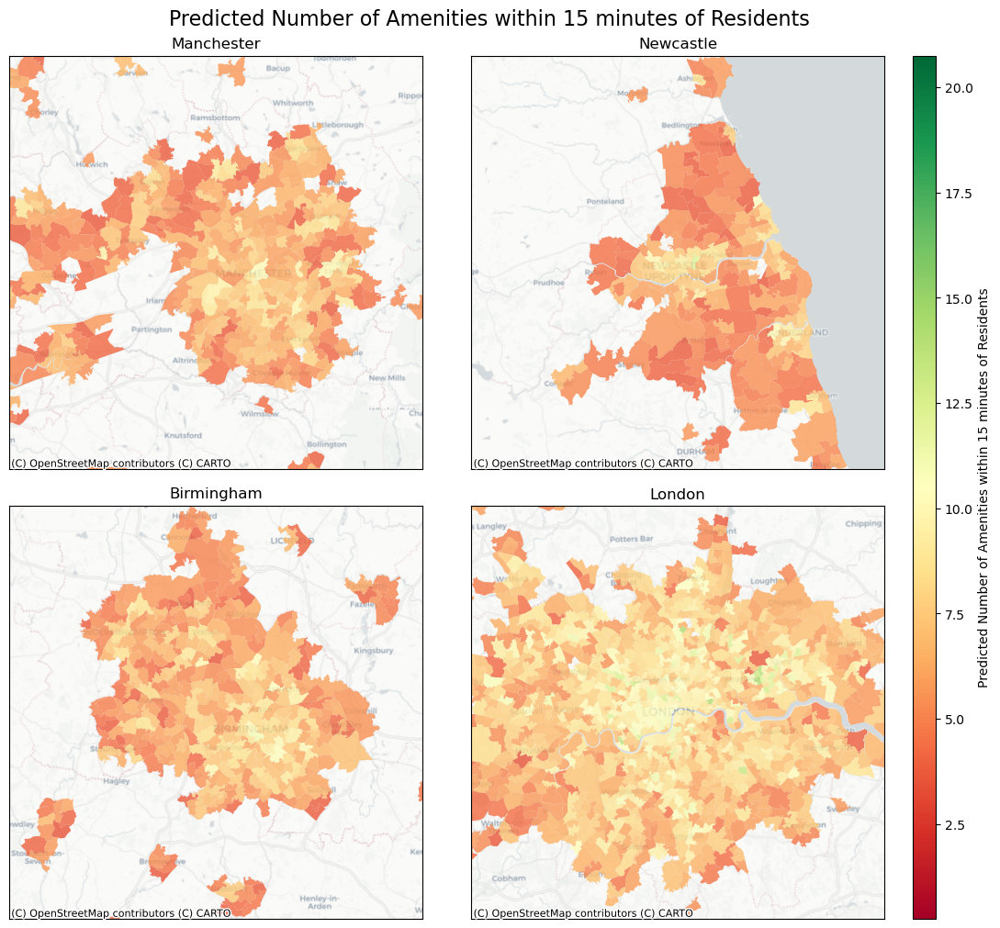

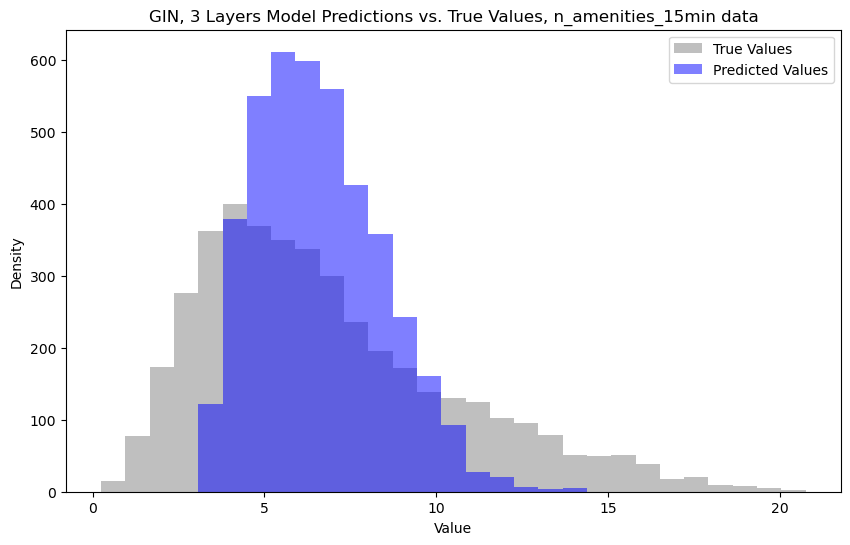

R^2 Score: 0.3771793192911037


In [106]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

#### 5 layer GIN

In [107]:
num_layers=5

1
Training GIN Model
GIN 5 layers final training loss: 9.078615496514187
GIN 5 layers test loss: 11.47807841398278


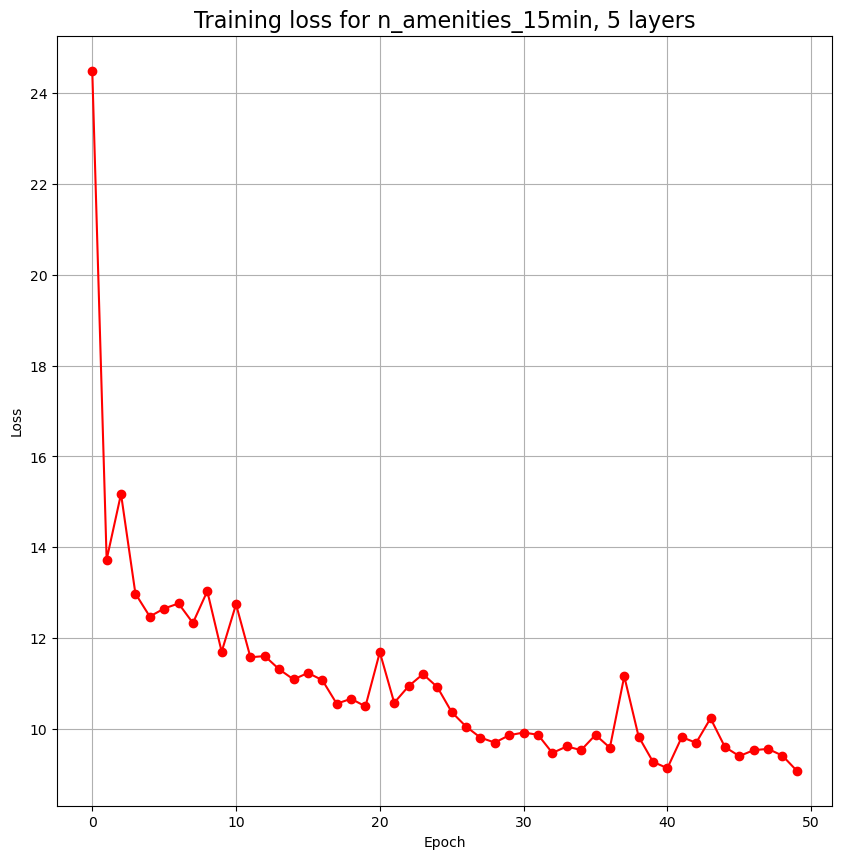

Saved plot to trained_models/n_amenities_15min/GIN/5_layers/GIN_5layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GIN/5_layers/GIN_5layer_Predictions.csv


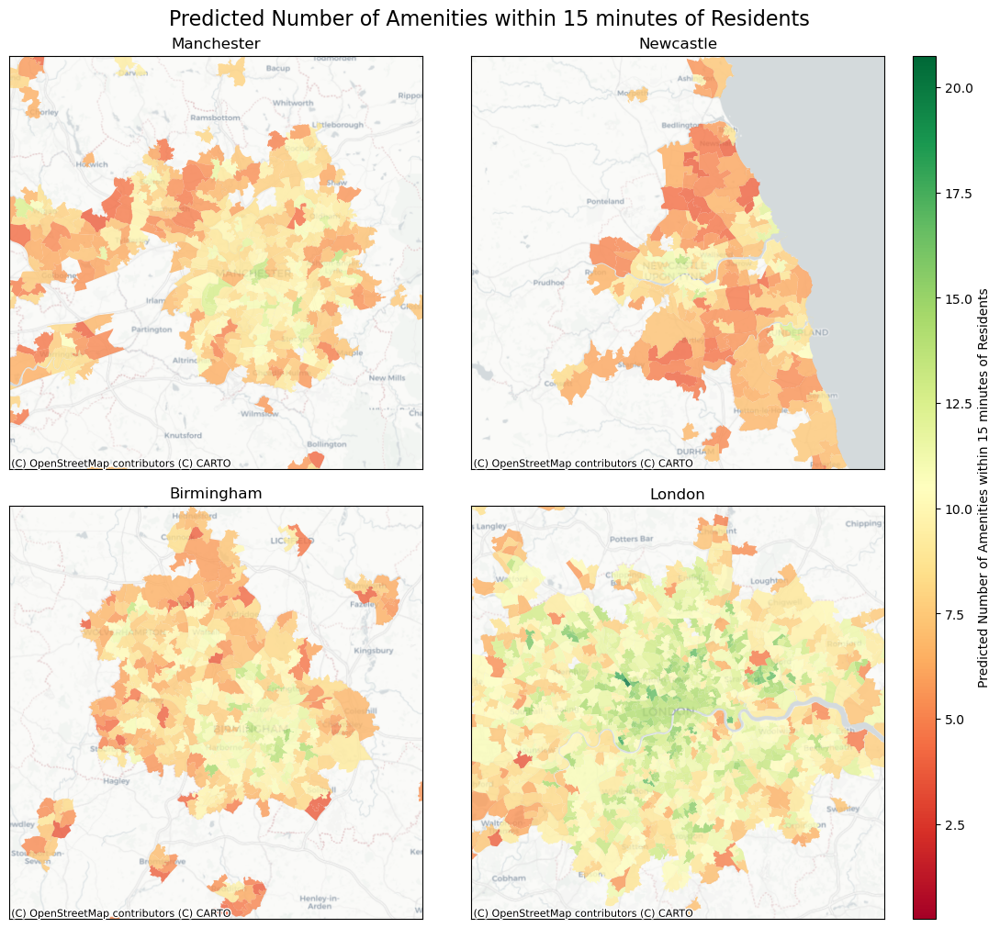

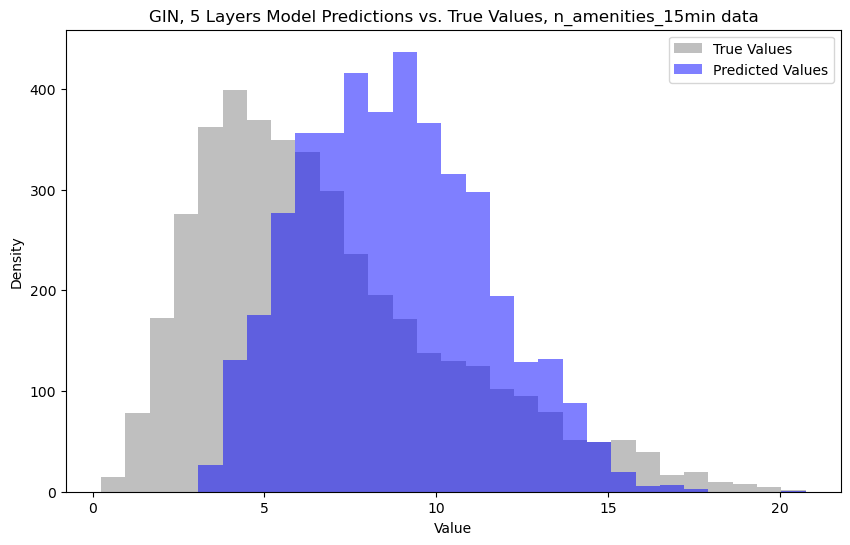

R^2 Score: 0.13480859689720204


In [108]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

#### 10 layer GIN

In [109]:
num_layers=10

1
Training GIN Model
GIN 10 layers final training loss: 9.280529975747877
GIN 10 layers test loss: 7.3383014977765395


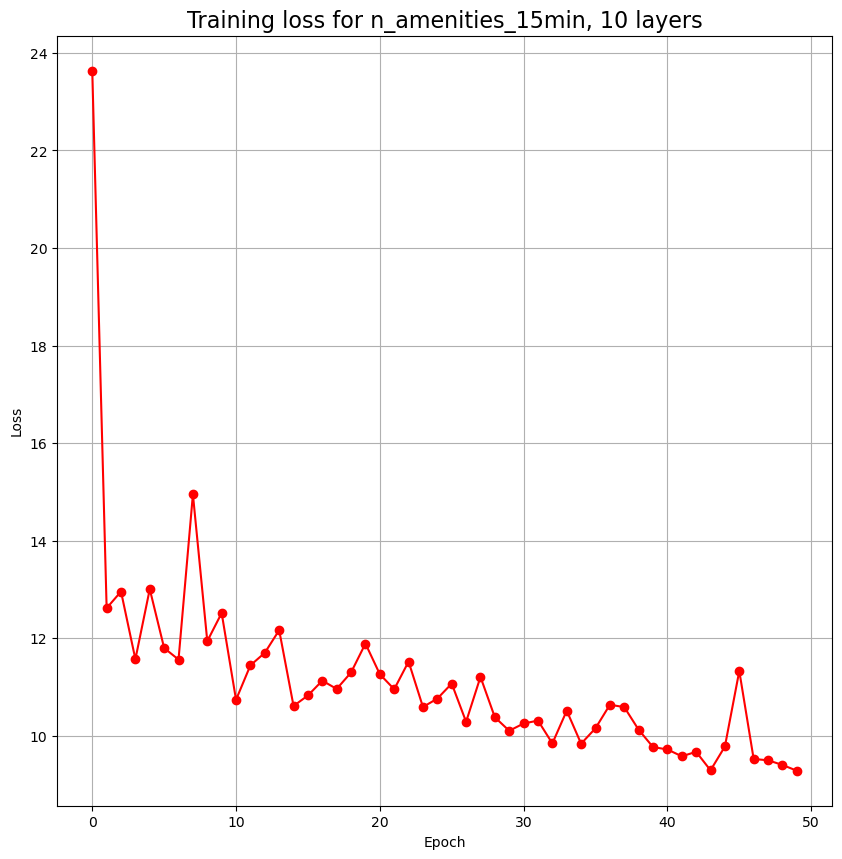

Saved plot to trained_models/n_amenities_15min/GIN/10_layers/GIN_10layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GIN/10_layers/GIN_10layer_Predictions.csv


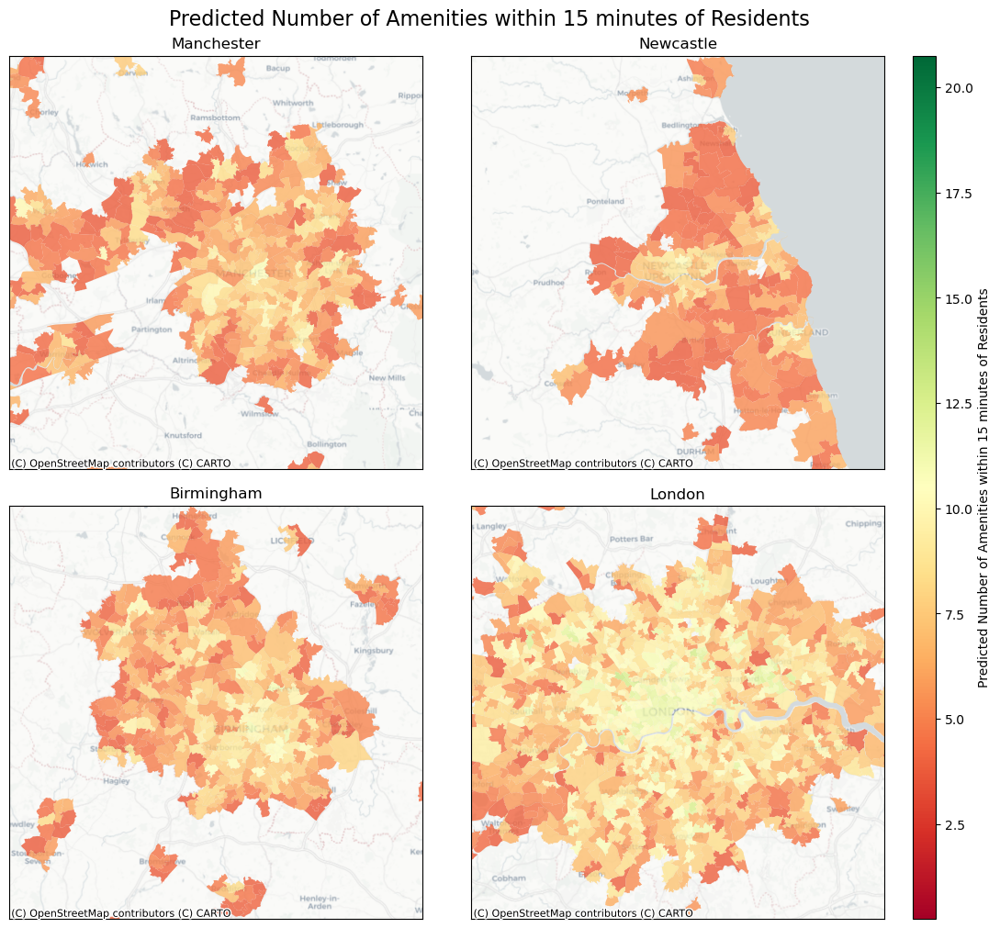

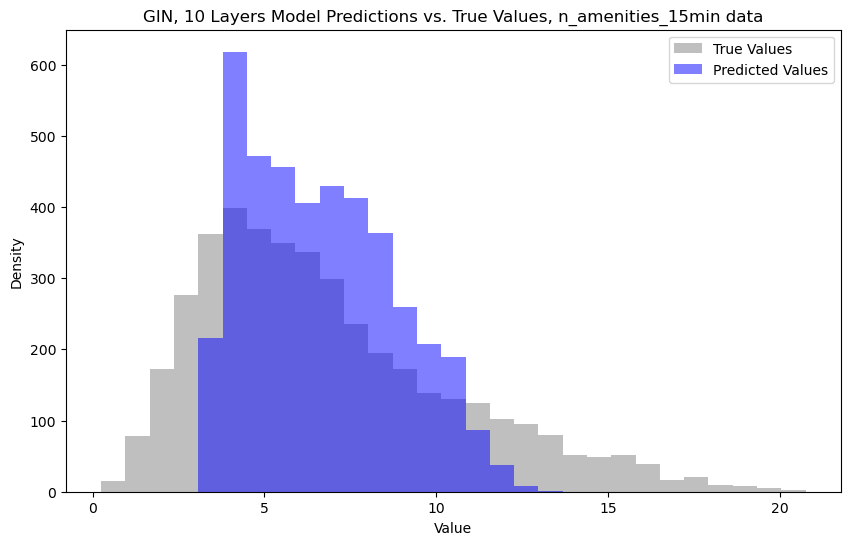

R^2 Score: 0.40859046719477865


In [110]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

### Test with more hidden channels
64 hidden channels has best performance

#### 64 hidden channels

In [113]:
hidden_channels = 64
data = 'n_amenities_15min'
plot_title = 'Predicted Number of Amenities within 15 min of Residents'
num_layers = 3

1
Training GIN Model
GIN 3 layers final training loss: 9.655745997017803
GIN 3 layers test loss: 7.849639242293597


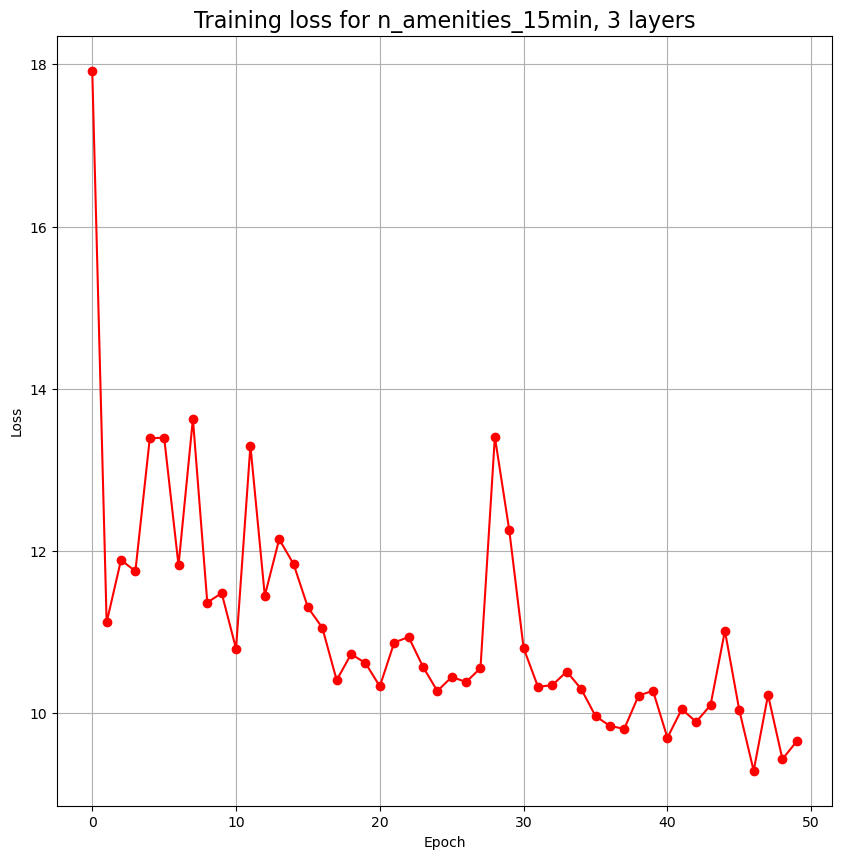

Saved plot to trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer_Predictions.csv


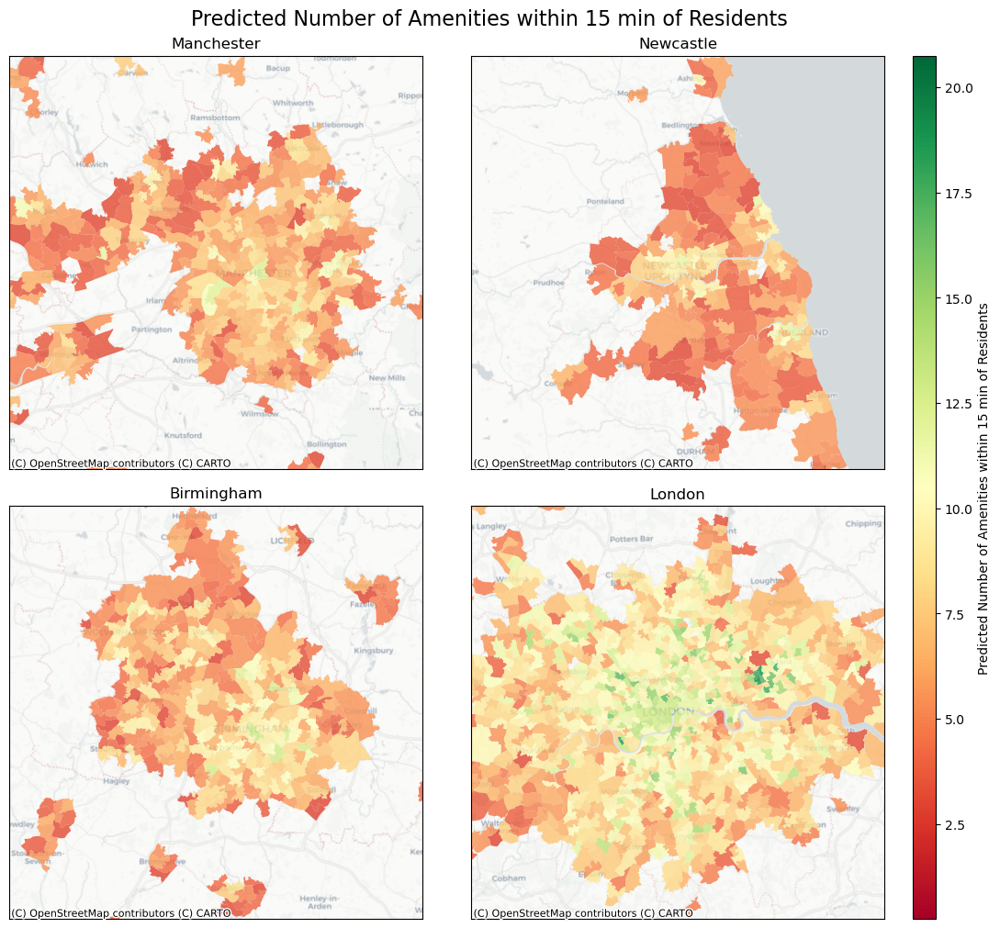

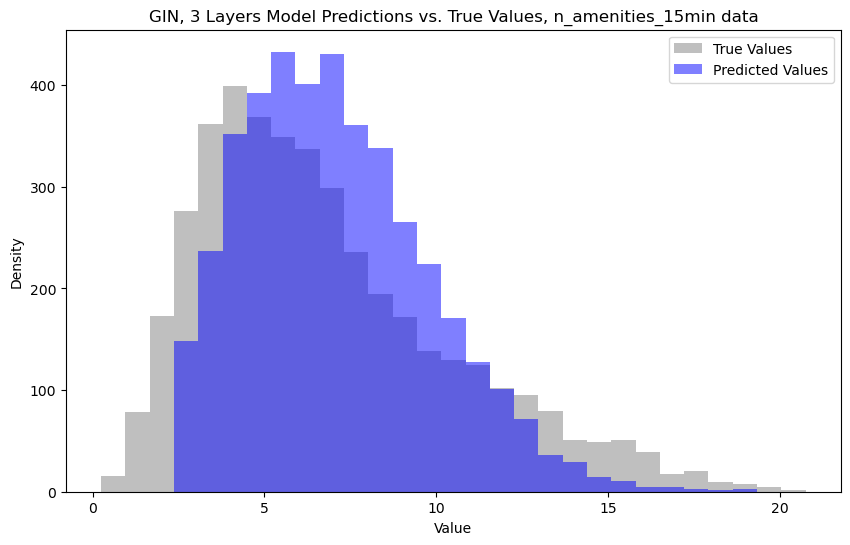

R^2 Score: 0.3872190887481868


In [114]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

#### 128 hidden channels

In [111]:
hidden_channels = 128
data = 'n_amenities_15min'
plot_title = 'Predicted Number of Amenities within 15 min of Residents (No positional encoding, sum)'
num_layers = 3

1
Training GIN Model
GIN 3 layers final training loss: 10.060867663939531
GIN 3 layers test loss: 8.186925848563607


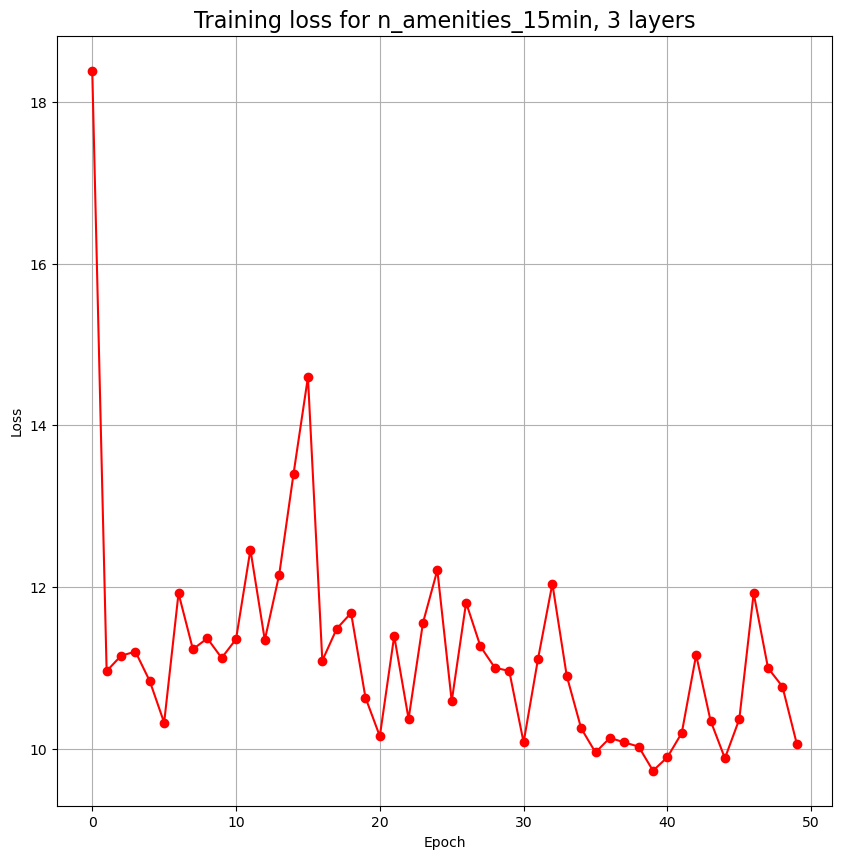

Saved plot to trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer_Predictions.csv


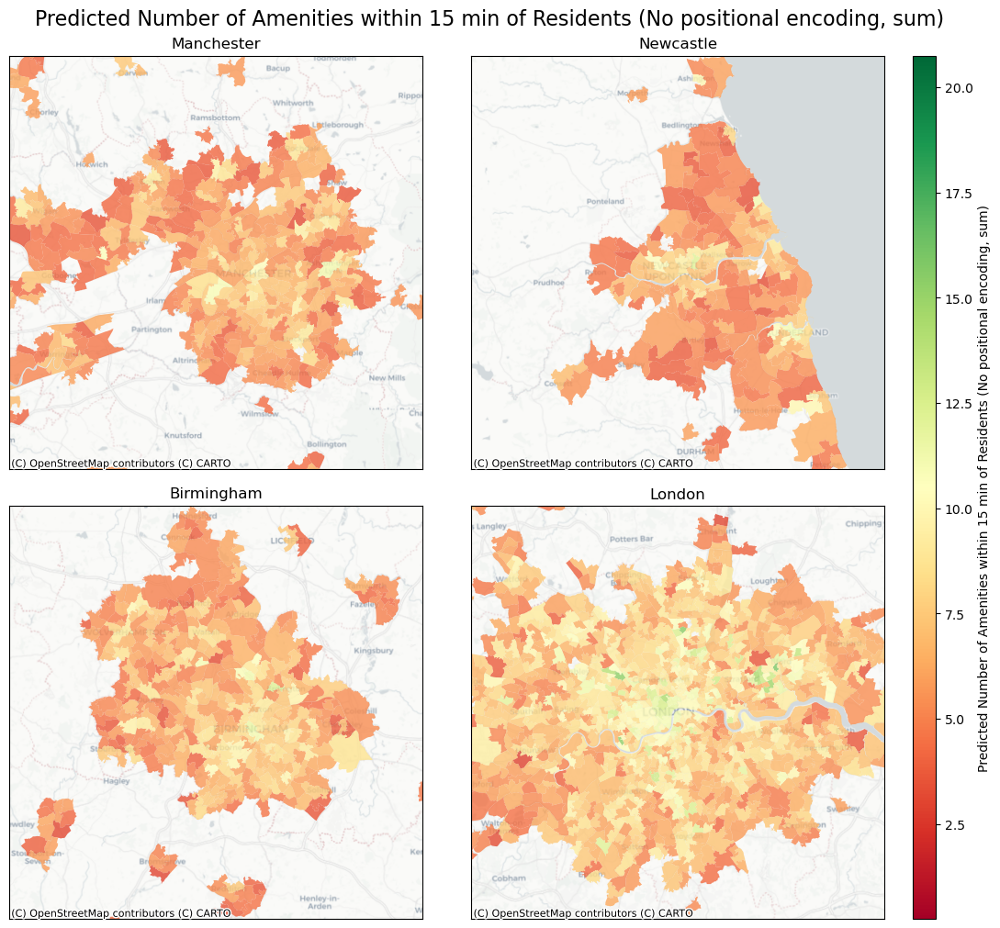

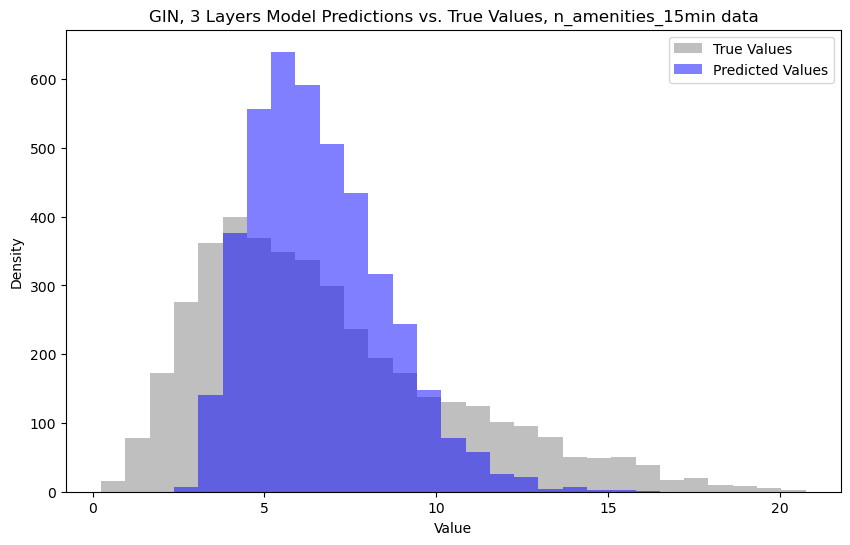

R^2 Score: 0.3450015086044199


In [112]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

### Test Positional Encoding
No positional encoding has best performance

In [115]:
data = 'n_amenities_15min_pos_enc'
plot_title = 'Predicted Number of Amenities within 15 min of Residents (Positional Encoding)'
hidden_channels = 64
num_layers = 3

5
Training GIN Model
GIN 3 layers final training loss: 9.4634651603481
GIN 3 layers test loss: 10.297182510165321


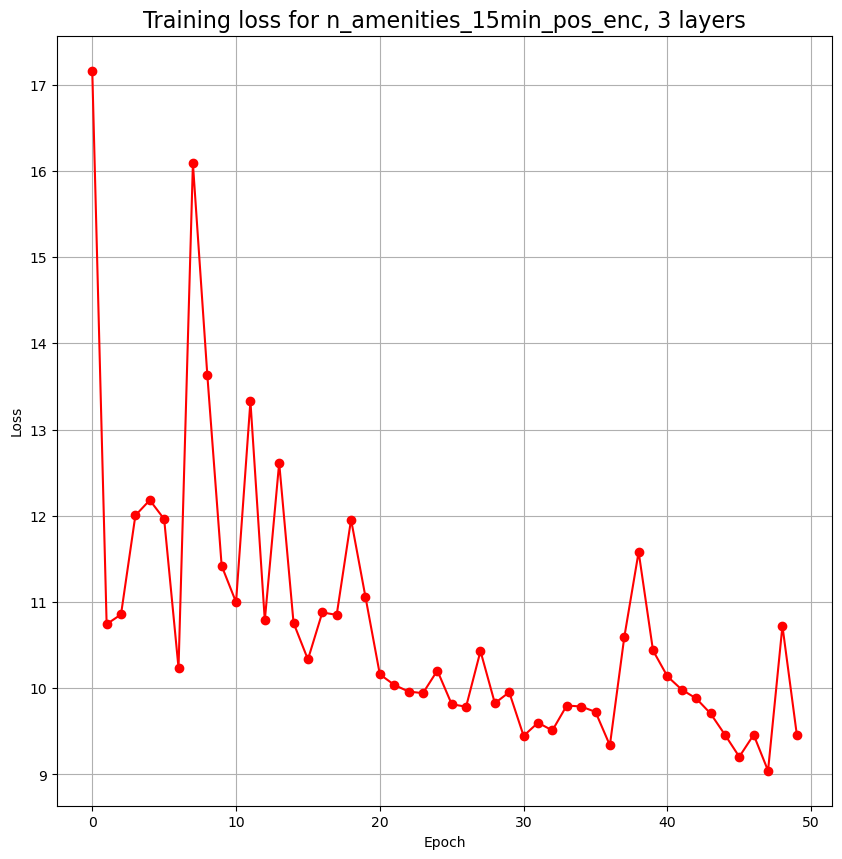

Saved plot to trained_models/n_amenities_15min_pos_enc/GIN/3_layers/GIN_3layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min_pos_enc/GIN/3_layers/GIN_3layer_Predictions.csv


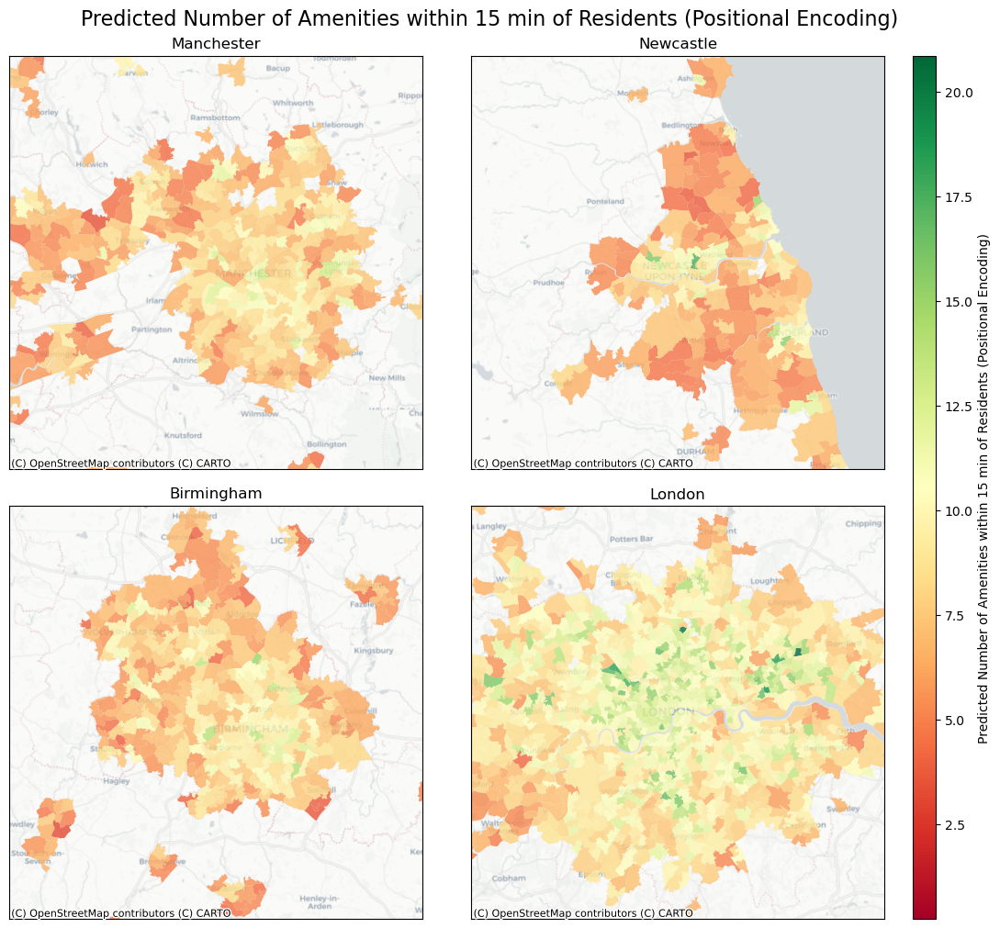

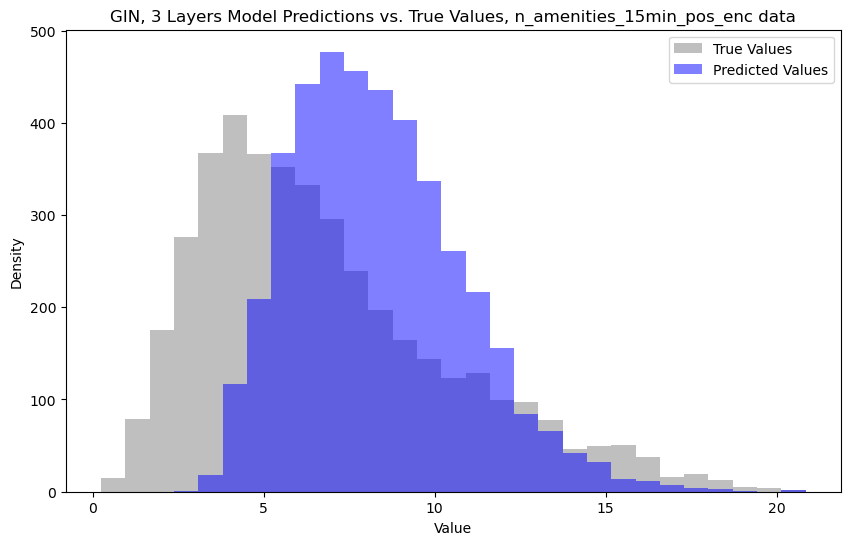

R^2 Score: 0.22352693346583008


In [116]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

### Best performing model:
* GIN
* 5 layers
* 128 hidden channels
* No positional encoding

## Spatial dependency test on best performing model

#### Function to create isolated test dataset in Birmingham

In [125]:
class EW_msoa_graphs_spatial_dependency_test(Dataset):
    """ Function to create a train dataset excluding West Midlands, 
    and a test dataset of only West Midlands, in order to test how spatial dependencies influence results."""
    def __init__(self, root):
        super(EW_msoa_graphs_spatial_dependency_test, self).__init__()
        self.root = root
        self.file_list = [f for f in os.listdir(root) if f.endswith('.pt')]  # Cache the file list once
        self.spatial_dependency_data = pd.read_csv('geographies/spatial_dependency_data.csv')

    @property
    # make list of cities in the processed .pt file
    def processed_file_names(self):
        return [f'{msoa}' for msoa in os.listdir(self.root) if msoa.endswith('.pt')]

    def len(self):
        return len(self.processed_file_names)

    def get(self, idx):
        file_name = self.processed_file_names[idx]  # This will automatically raise IndexError if idx is out of range
        return self.load_graph(os.path.join(self.root, file_name))

    def load_graph(self, file_path):
        try:
            return torch.load(file_path)
        except FileNotFoundError:
            raise FileNotFoundError(f"File {file_path} not found.")

    def get_by_filename(self, filename):
        # Method to load a graph directly by filename
        if filename in self.processed_file_names:
            return self.load_graph(os.path.join(self.root, filename))
        else:
            raise FileNotFoundError(f"File {filename} not found in dataset directory.")

    def get_train_test_datasets(self):
        train_graphs = []
        test_graphs = []
        # Categorize each graph based on the loaded spatial dependency data
        for filename in self.processed_file_names:
            # Extract MSOA11CD
            msoa_code = filename.split('.')[0]
            
            # Get the data category from the spatial dependency data
            data_category = self.spatial_dependency_data.loc[
                self.spatial_dependency_data['MSOA11CD'] == msoa_code, 'Data Category'
            ].iloc[0]
            
            if data_category == 'West Midlands Test Data':
                test_graphs.append(filename)
            elif data_category == 'Training Data':
                train_graphs.append(filename)
                
        return train_graphs, test_graphs

#### Function to call spatial dependency test

In [126]:
def call_single_spatial_dependency_test(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column):
    """ 
    The same as the previous call function, but uses the spatial dependency test dataset.
    """
    y_file_path = f'clean_y_values/y_{data}.csv'
    y_file = pd.read_csv(y_file_path)
    
    data_folder = f'graphs/graphs_{data}'
    dataset = EW_msoa_graphs_spatial_dependency_test(root=data_folder)
    legend_title = plot_title

    # Get filtered lists of filenames for train and test datasets
    train_filenames, test_filenames = dataset.get_train_test_datasets()

    # Create custom datasets from filtered filenames
    train_dataset = [dataset.get_by_filename(fn) for fn in train_filenames]
    test_dataset = [dataset.get_by_filename(fn) for fn in test_filenames]
    
    # DataLoader with specific seed for reproducibility in the sampling process
    train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

    model_losses_list = []
    
    num_node_features = dataset.num_node_features
        
    criterion=torch.nn.MSELoss()

    model=model_class(num_node_features, num_layers, hidden_channels)
    
    optimizer = Adam(model.parameters(), lr=0.01)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    epochs = epochs

    class_string = f'{model_class}'
    model_name = class_string.split('.')[-1].rstrip("'>")

    print(f'Training {model_name} Model')

    # Train model and record training loss
    epoch_losses, average_loss = train(model, optimizer, criterion, device, epochs, train_loader)
    test_loss = test(model, criterion, device, test_loader)
    print(f"{model_name} {num_layers} layers final training loss: {average_loss}")
    print(f"{model_name} {num_layers} layers test loss: {test_loss}")
        
    save_model(model, model_name, num_layers, data)

    plot_model_training(model_name, epoch_losses, num_layers, data)
    prediction = get_model_predictions(model, y_file, data_folder)
    plot_model_prediction(prediction, num_layers, data, model_class, model_name, plot_title, y_truth_column, legend_title)
    plot_predicted_data_distribution(prediction, model_name, num_layers, data, y_truth_column)

### Run test

In [127]:
data = 'n_amenities_15min'
hidden_channels = 64
num_layers = 10
model_class = GIN
plot_title = 'Amenity Accessibility Predictions Spatial Dependency Test'

Training GIN Model
GIN 10 layers final training loss: 8.816827585782049
GIN 10 layers test loss: 4.79461489269912


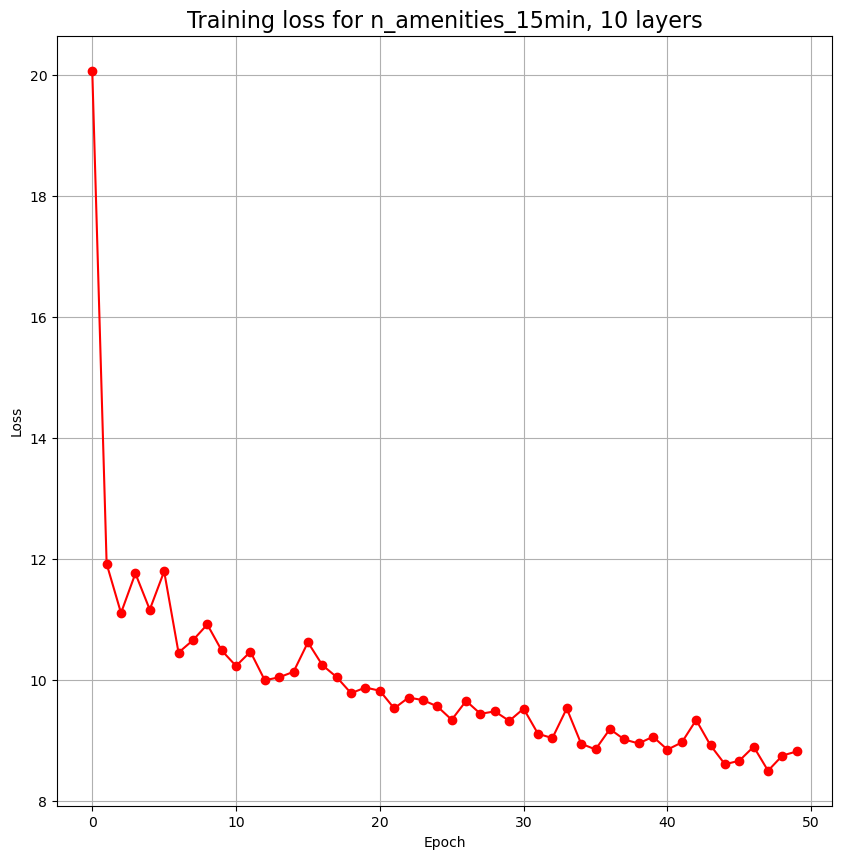

Saved plot to trained_models/n_amenities_15min/GIN/10_layers/GIN_10layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GIN/10_layers/GIN_10layer_Predictions.csv


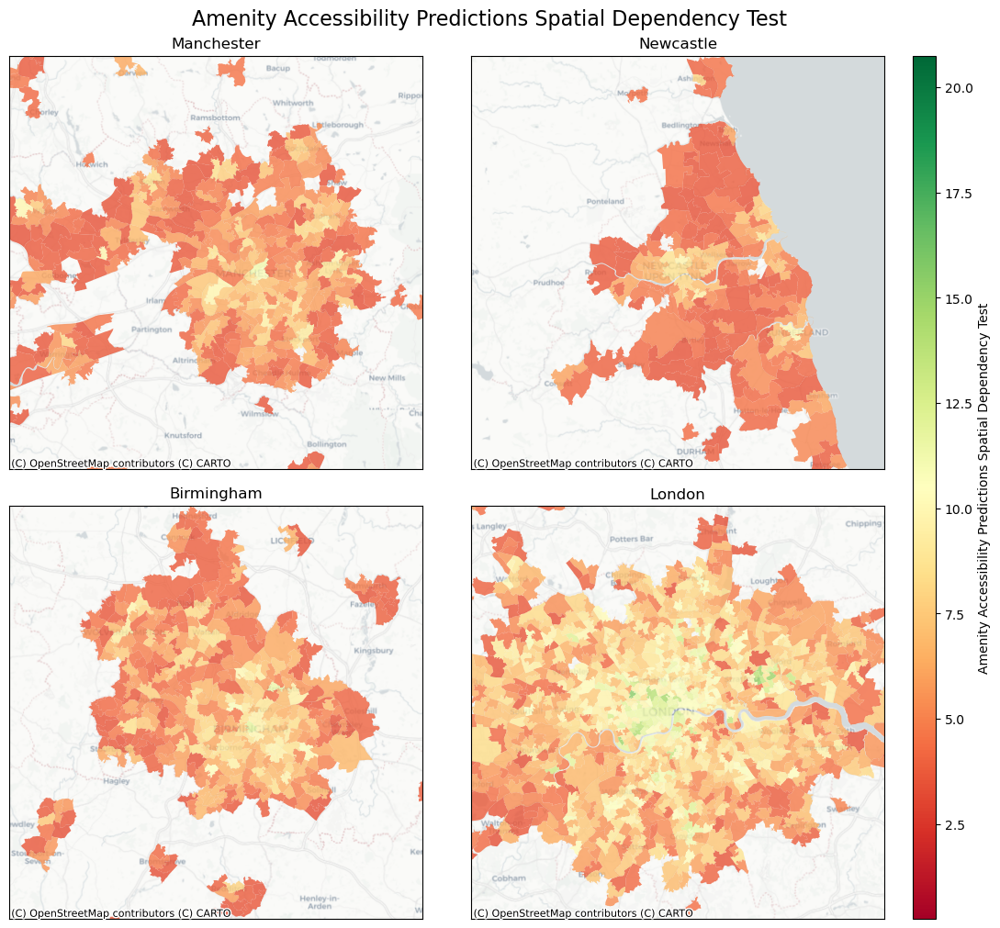

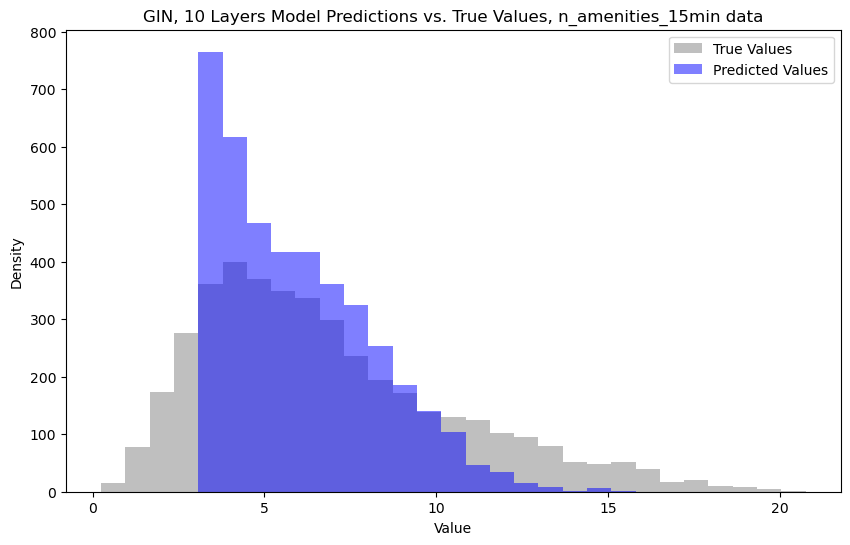

R^2 Score: 0.3905247705226349


In [128]:
call_single_spatial_dependency_test(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

## Train best model until loss plateaus

In [131]:
data = 'n_amenities_15min'
y_truth_column = 'n_amenities_15min'
plot_title = 'Predicted Number of Amenities within 15 minutes of Residents'
hidden_channels = 64
num_layers = 3
epochs = 150
model_class=GIN

1
Training GIN Model
GIN 3 layers final training loss: 8.662003204392112
GIN 3 layers test loss: 7.389376466872455


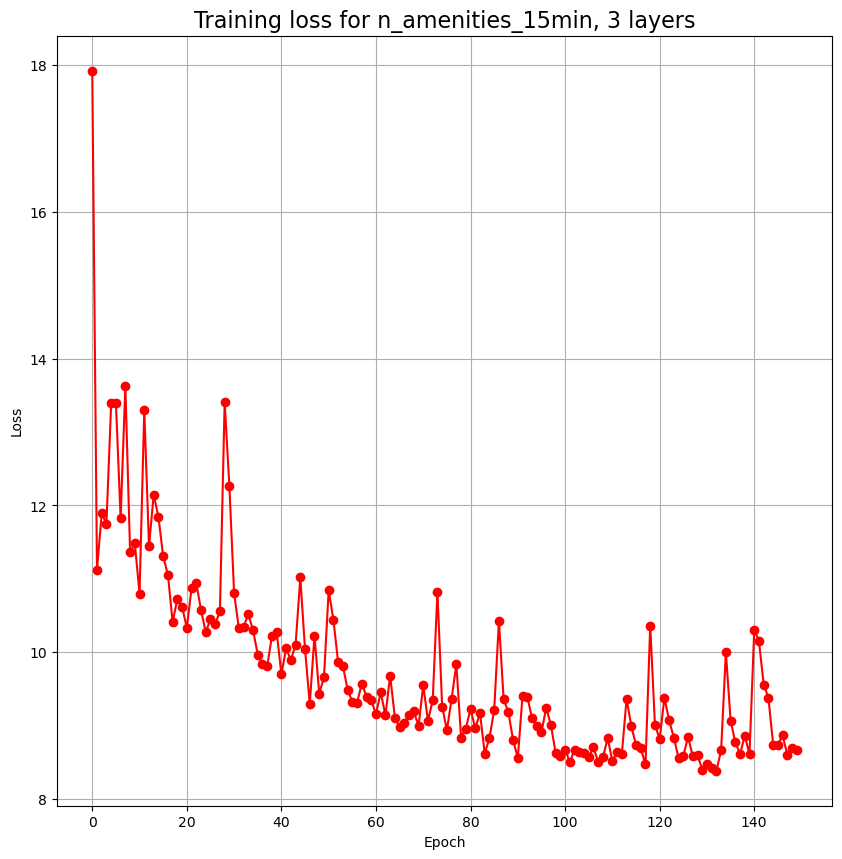

Saved plot to trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer_Predictions.png
Saved CSV to trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer_Predictions.csv


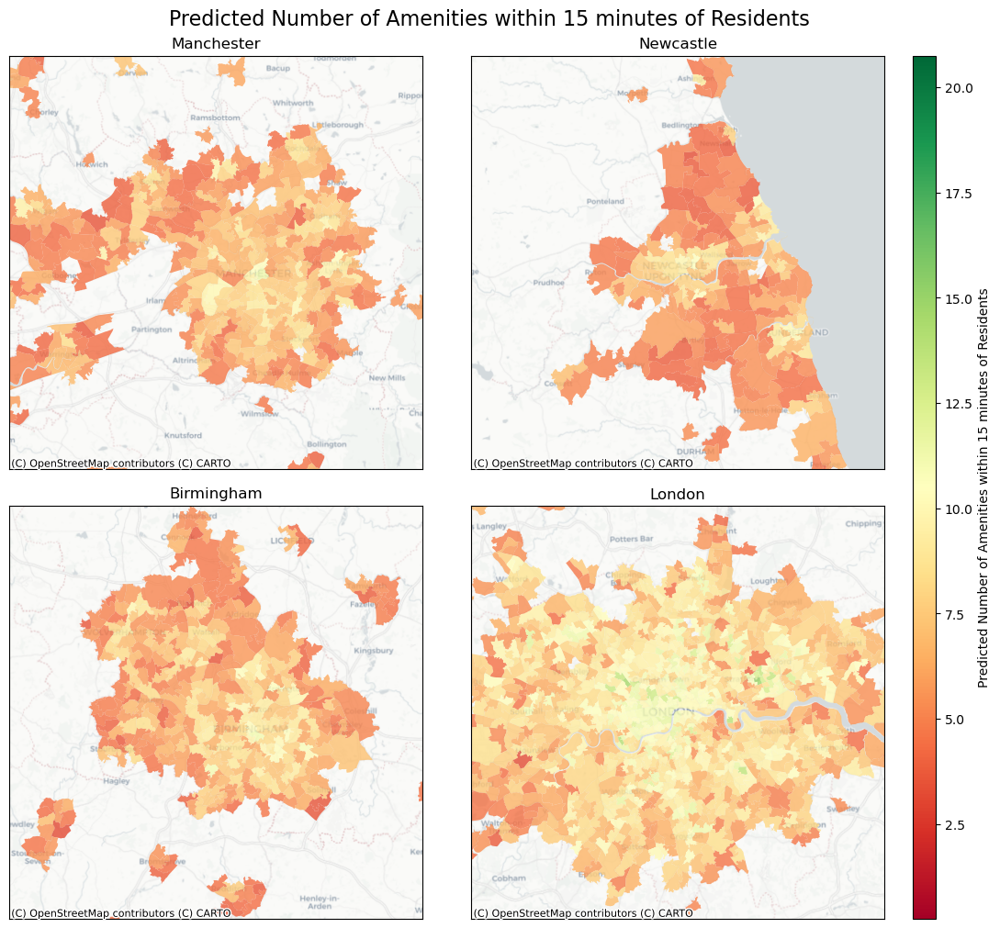

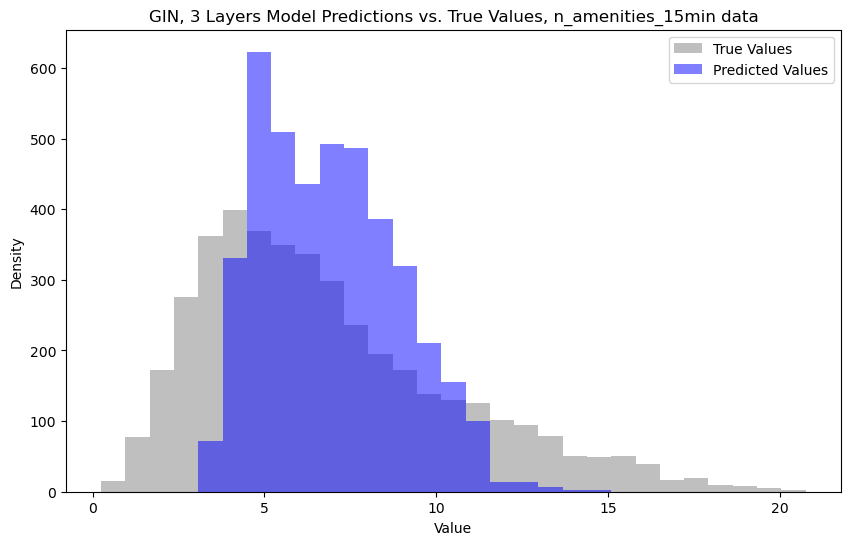

R^2 Score: 0.40905888375862587


In [132]:
call_model(data, num_layers, hidden_channels, epochs, model_class, plot_title, y_truth_column)

# Function to save graph embeddings

In [135]:
model_class=GIN
model_path='trained_models/n_amenities_15min/GIN/3_layers/GIN_3layer.pth'
num_features=1
num_layers=3
hidden_channels=64
data = 'n_amenities_15min'
data_folder = 'graphs/graphs_n_amenities_15min'

In [136]:
model = load_model(model_class, model_path, num_features, num_layers, hidden_channels)
model.enable_embedding_output()
model.eval()

# Initialize empty list to store data
data_list = []

def load_graph(filename):
    return torch.load(filename)
    
# Loop through each MSOA and get embeddings
with torch.no_grad():
    for index, row in msoa.iterrows():
        file_path = os.path.join(data_folder, row['MSOA11CD'] + '.pt')
        if os.path.exists(file_path):  # Check if the graph file exists
            graph = load_graph(file_path)
            # Get single graph per batch, no batch dimension needed
            batch = torch.zeros(graph.num_nodes, dtype=torch.long)
            # Get embedding
            embeddings = model(graph.x, graph.edge_index, batch)
            # Ensure embeddings are detached and moved to CPU for DataFrame usage
            embeddings = embeddings.squeeze().detach().cpu().numpy()
            # Append MSOA code and embeddings to data list
            data_list.append([row['MSOA11CD']] + embeddings.tolist())

In [139]:
# Create column names
column_names = ['MSOA11CD'] + [f'embedding_{i}' for i in range(hidden_channels)]

# Create a DataFrame
embeddings_df = pd.DataFrame(data_list, columns=column_names)

# Check the DataFrame
embeddings_df

,MSOA11CD,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,...,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63
0,E02000001,0.051222,0.101526,-0.041834,-0.242048,-0.014840,-0.131487,0.231286,-0.032314,-0.244136,...,0.524148,-0.450224,-0.114704,-0.089924,-0.070527,0.343175,-0.062596,-0.191703,0.075840,-0.159888
1,E02000002,0.006923,0.083473,0.031810,-0.104261,-0.010304,0.004102,0.113241,0.022458,-0.118940,...,0.033215,-0.021271,-0.130279,-0.040347,0.040934,0.088267,-0.025366,-0.107575,-0.016354,-0.034776
2,E02000003,0.003238,0.100971,-0.035656,-0.145040,0.025577,-0.084681,0.157477,0.019681,-0.207082,...,0.253634,-0.199919,-0.101446,-0.057923,-0.016306,0.202908,-0.006045,-0.074960,0.024148,-0.050654
3,E02000004,-0.014869,0.116149,0.014332,-0.089048,0.042897,-0.080716,0.072958,0.053904,-0.049451,...,-0.035050,0.031338,-0.223579,-0.066406,0.010627,0.036644,0.014016,-0.069314,-0.019872,-0.042178
4,E02000005,0.018594,0.071701,-0.034628,-0.150950,0.071346,-0.215459,0.064649,0.003309,-0.061096,...,0.254846,-0.206476,-0.190655,-0.076830,-0.056029,0.117679,-0.002779,-0.102247,-0.004015,-0.083400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4157,E02006930,0.034514,0.125157,-0.009183,-0.212545,-0.049470,-0.021291,0.260192,-0.007830,-0.276011,...,0.378065,-0.327332,-0.099340,-0.076292,-0.024364,0.319743,-0.061652,-0.172774,0.076501,-0.131167
4158,E02006931,0.024526,0.094866,0.000544,-0.161921,-0.007242,-0.063864,0.156978,0.001543,-0.156021,...,0.229232,-0.195323,-0.140770,-0.065216,-0.011323,0.185495,-0.039494,-0.145418,0.022456,-0.092413
4159,E02006932,0.026199,0.102819,-0.077859,-0.222082,0.036794,-0.190316,0.192418,-0.016262,-0.241389,...,0.526297,-0.443159,-0.108369,-0.094137,-0.087894,0.317883,-0.029501,-0.119599,0.074132,-0.130897
4160,E02006933,0.013415,0.145165,-0.078109,-0.229875,0.009221,-0.120410,0.268771,0.003709,-0.332096,...,0.531321,-0.450822,-0.091742,-0.100103,-0.075753,0.386678,-0.030637,-0.109664,0.112775,-0.133020


Save embeddings with most successful predictions

In [138]:
embeddings_df.to_csv('trained_models/n_amenities_15min/GIN/3_layers/embeddings.csv', index=False)